# **Accessing Data-Driven Models for Predictive and Prescriptive Maintenance in Safety-Critical Systems**
## **Case Study:** NASA CMAPSS Jet Engine Dataset

### Abstract 
Safety-critical systems, such as those in aviation, healthcare, and nuclear power, require effective 
maintenance strategies to ensure optimal performance and prevent catastrophic failures. 
Predictive and prescriptive maintenance models leveraging Artificial Intelligence (AI) and Data 
Science have gained traction in various industries, but applying these models to safety-critical 
systems presents unique challenges. These challenges include ensuring data quality, model 
accuracy, transparency, and the integration of AI with legacy systems, all of which are crucial for 
maintaining safety and reliability in these critical environments. This research investigates datadriven models for predictive and prescriptive maintenance of the NASA Turbofan Jet Engine, a 
safety-critical system. The study evaluates key metrics, including Root Mean Square Error 
(RMSE), Mean Absolute Error (MAE), and R-squared (R²), to assess the effectiveness and 
reliability of maintenance models. Regression models built with machine learning techniques such 
as Long Short-Term Memory (LSTM), LSTM with Convolutional Neural Network (LSTM+CNN), 
Transformer, XGBoost, Random Forest, and Decision Tree, are compared. The results show that 
the XGBoost model achieves the most accurate predictions, with the lowest test RMSE of 
approximately 31 and test MAE of 25, outperforming more complex deep learning models like 
LSTM (test RMSE 37, test MAE 29) and Transformer (test RMSE 44, test MAE 36). While the 
LSTM+CNN model has slightly higher errors, it demonstrates a stronger ability to capture complex 
patterns, reflected in its highest test R² of around 0.5. In contrast, the Decision Tree model 
performs poorly, with a test R² of -0.25, indicating a significant mismatch with the data. 
Additionally, the study developed prescriptive anomaly detection classifiers, with the XGBoost 
and Random Forest models achieving exceptional test data accuracy of 97.8% and 98.6%, 
respectively, in categorising engine health into high-risk, moderate-risk, and low-risk levels. These 
results enable proactive maintenance planning and resource allocation. This research provides 
valuable insights into the assessment and improvement of data-driven maintenance strategies 
for safety-critical systems, with the ultimate goal of enhancing their overall performance, safety, 
and reliability.


### Import Libraries

In [1]:
# File Processing
from google.colab import drive

# Data manipulation and mathematical operations
import pandas as pd
import numpy as np
import math

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn metrics and model selection tools
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV

# Scikit-learn preprocessing tools
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Machine learning models from Scikit-learn and XGBoost
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier

# TensorFlow and Keras for deep learning models
import tensorflow as tf
from tensorflow.keras import layers, regularizers
from tensorflow.keras.optimizers import Adam

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")

### Mount the drive to retrieve data

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


## Import C-MAPSS Data

In [3]:
# Data Set: FD001
# Train trajectories: 100
# Test trajectories: 100
# Conditions: ONE (Sea Level)
# Fault Modes: ONE (HPC Degradation)

train_FD001_df = pd.read_csv("https://drive.google.com/uc?id=1G5W-9FdEllkiEOq-L6UcgkBHi_j1we3r", sep=" ", header=None)
test_FD001_df = pd.read_csv("https://drive.google.com/uc?id=1l70YnfyF7nK9_nxkkJcQFmysMEtcH1av", sep=" ", header=None)
rul_FD001_df = pd.read_csv("https://drive.google.com/uc?id=1uF3NV_E1rYoVX8eRYJcjE5QKwRd3e1NK", sep=" ", header=None)

In [4]:
# Data Set: FD002
# Train trajectories: 260
# Test trajectories: 259
# Conditions: SIX
# Fault Modes: ONE (HPC Degradation)

train_FD002_df = pd.read_csv("https://drive.google.com/uc?id=1nF2aWYlBBS4hECJCDLy2qE9IZG8VPFxQ", sep=" ", header=None)
test_FD002_df = pd.read_csv("https://drive.google.com/uc?id=1jTAWOP0frfBUHRGK-_4eM2L3aTY5VHlS", sep=" ", header=None)
rul_FD002_df = pd.read_csv("https://drive.google.com/uc?id=1XkyzGO1r48UnDdbbR27FO4Rtty-RH8d5", sep=" ", header=None)

In [5]:
# Data Set: FD003
# Train trjectories: 100
# Test trajectories: 100
# Conditions: ONE (Sea Level)
# Fault Modes: TWO (HPC Degradation, Fan Degradation)

train_FD003_df = pd.read_csv("https://drive.google.com/uc?id=1yJDtXj1a4WWw-TJsOuxM9GepCn_6vieX", sep=" ", header=None)
test_FD003_df = pd.read_csv("https://drive.google.com/uc?id=1Bpul3r6fcWnS8v0ad-nTC45QfaqTrG1T", sep=" ", header=None)
rul_FD003_df = pd.read_csv("https://drive.google.com/uc?id=1n-yPUXF2xD31cy1mO2eLsoouMpp59l1e", sep=" ", header=None)

In [6]:
# Data Set: FD004
# Train trjectories: 248
# Test trajectories: 249
# Conditions: SIX
# Fault Modes: TWO (HPC Degradation, Fan Degradation)

train_FD004_df = pd.read_csv("https://drive.google.com/uc?id=1DaKWRc4N8F7xlAVWx4HBFLPPnMWzSNG3", sep=" ", header=None)
test_FD004_df = pd.read_csv("https://drive.google.com/uc?id=1iMtzTaEVijdHRpoR1uVWJLvEzf6NBpbx", sep=" ", header=None)
rul_FD004_df = pd.read_csv("https://drive.google.com/uc?id=1ctT6D04fNYaUNFNjYu4f5UiEhcLDzhOJ", sep=" ", header=None)

## Preview Raw CMAPSS Data

In [7]:
train_FD001_df.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,NaN,NaN
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN


In [8]:
test_FD001_df.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735,NaN,NaN
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916,NaN,NaN
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166,NaN,NaN
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737,NaN,NaN
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130,NaN,NaN


In [9]:
rul_FD001_df.head() # RUL of Test Dataset

,0,1
0,112,NaN
1,98,NaN
2,69,NaN
3,82,NaN
4,91,NaN


## Clean Data (Remove NaN Columns)

In [10]:
# clean Data Set: FD001
train_FD001_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the training dataset
test_FD001_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the test dataset
rul_FD001_df.drop(columns=[1], inplace=True) # Dropping column 1 from the Remaining Useful Life (RUL) dataset

In [11]:
# clean Data Set: FD002
train_FD002_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the training dataset
test_FD002_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the test dataset
rul_FD002_df.drop(columns=[1], inplace=True) # Dropping column 1 from the Remaining Useful Life (RUL) dataset

In [12]:
# clean Data Set: FD003
train_FD003_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the training dataset
test_FD003_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the test dataset
rul_FD003_df.drop(columns=[1], inplace=True) # Dropping column 1 from the Remaining Useful Life (RUL) dataset

In [13]:
# clean Data Set: FD004
train_FD004_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the training dataset
test_FD004_df.drop(columns=[26, 27], inplace=True) # Dropping columns 26 and 27 from the test dataset
rul_FD004_df.drop(columns=[1], inplace=True) # Dropping column 1 from the Remaining Useful Life (RUL) dataset

## Confirm that redundant columns have been cleaned



In [14]:
train_FD001_df.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [15]:
test_FD001_df.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


In [16]:
rul_FD001_df.head()

,0
0,112
1,98
2,69
3,82
4,91


## Summarize dataset shapes

In [17]:
print(f"Shape of train_FD001: {train_FD001_df.shape}")
print(f"Shape of test_FD001: {test_FD001_df.shape}")
print(f"Shape of rul_FD001: {rul_FD001_df.shape}")

Shape of train_FD001: (20631, 26)
Shape of test_FD001: (13096, 26)
Shape of rul_FD001: (100, 1)


In [18]:
print(f"Shape of train_FD002: {train_FD002_df.shape}")
print(f"Shape of test_FD002: {test_FD002_df.shape}")
print(f"Shape of rul_FD002: {rul_FD002_df.shape}")

Shape of train_FD002: (53759, 26)
Shape of test_FD002: (33991, 26)
Shape of rul_FD002: (259, 1)


In [19]:
print(f"Shape of train_FD003: {train_FD003_df.shape}")
print(f"Shape of test_FD003: {test_FD003_df.shape}")
print(f"Shape of rul_FD003: {rul_FD003_df.shape}")

Shape of train_FD003: (24720, 26)
Shape of test_FD003: (16596, 26)
Shape of rul_FD003: (100, 1)


In [20]:
print(f"Shape of train_FD004: {train_FD004_df.shape}")
print(f"Shape of test_FD004: {test_FD004_df.shape}")
print(f"Shape of rul_FD004: {rul_FD004_df.shape}")

Shape of train_FD004: (61249, 26)
Shape of test_FD004: (41214, 26)
Shape of rul_FD004: (248, 1)


## Modify Data Columns

In [21]:
columns = ['engine', 'cycle', 'setting1', 'setting2', 'setting3', 'sensor1',
       'sensor2', 'sensor3', 'sensor4', 'sensor5', 'sensor6', 'sensor7',
       'sensor8', 'sensor9', 'sensor10', 'sensor11', 'sensor12', 'sensor13',
       'sensor14', 'sensor15', 'sensor16', 'sensor17', 'sensor18', 'sensor19',
       'sensor20', 'sensor21']

In [22]:
train_FD001_df.columns = columns
test_FD001_df.columns = columns
rul_FD001_df.columns = ['rul']

In [23]:
train_FD002_df.columns = columns
test_FD002_df.columns = columns
rul_FD002_df.columns = ['rul']

In [24]:
train_FD003_df.columns = columns
test_FD003_df.columns = columns
rul_FD003_df.columns = ['rul']

In [25]:
train_FD004_df.columns = columns
test_FD004_df.columns = columns
rul_FD004_df.columns = ['rul']

In [26]:
train_FD001_df['engine'].nunique()

100

In [27]:
test_FD001_df.head(50)

,engine,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130
5,1,6,0.0012,0.0003,100.0,518.67,642.11,1579.12,1395.13,14.62,...,521.92,2388.08,8127.46,8.4238,0.03,392,2388,100.0,38.91,23.3467
6,1,7,-0.0000,0.0002,100.0,518.67,642.11,1583.34,1404.84,14.62,...,522.01,2388.06,8134.97,8.3914,0.03,391,2388,100.0,38.85,23.3952
7,1,8,0.0006,-0.0000,100.0,518.67,642.54,1580.89,1400.89,14.62,...,522.09,2388.06,8125.93,8.4213,0.03,393,2388,100.0,39.05,23.3224
8,1,9,-0.0036,0.0000,100.0,518.67,641.88,1593.29,1412.28,14.62,...,522.03,2388.05,8134.15,8.4353,0.03,391,2388,100.0,39.10,23.4521
9,1,10,-0.0025,-0.0001,100.0,518.67,642.07,1585.25,1398.64,14.62,...,522.00,2388.06,8134.08,8.4093,0.03,391,2388,100.0,38.87,23.3820


In [28]:
rul_FD001_df.head()

,rul
0,112
1,98
2,69
3,82
4,91


## Data Visualisation

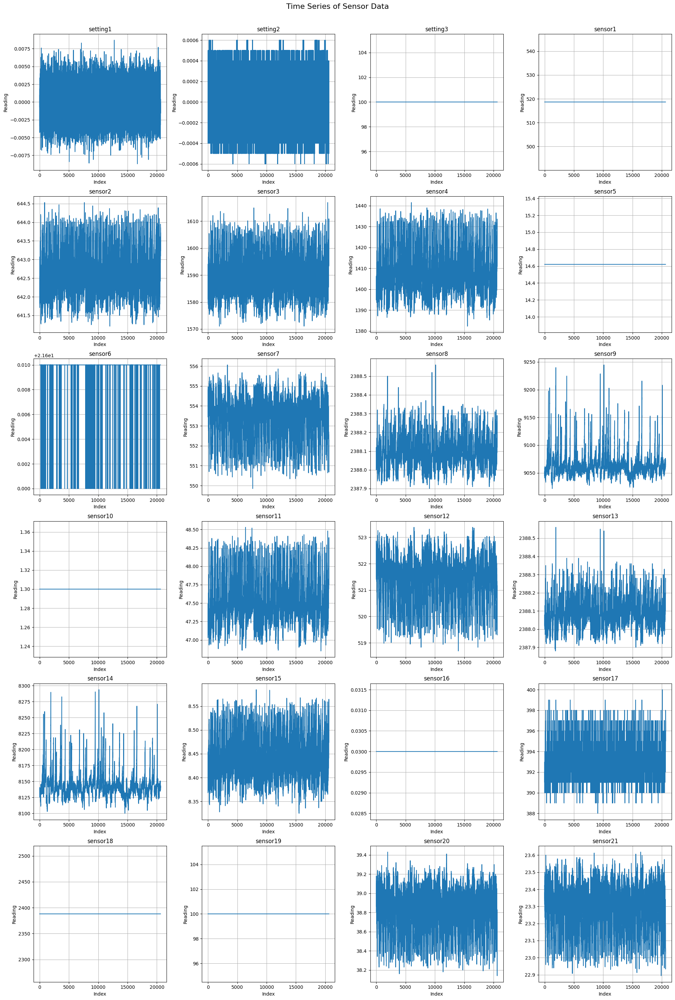

In [29]:
# Select all sensor columns starting from the 3rd column onward
sensor_columns = columns[2:]

# Count the number of sensor columns
num_sensors = len(sensor_columns)

# Set a fixed number of columns for the subplot layout
n_cols = 4

# Calculate the number of rows needed based on the number of sensor columns
n_rows = math.ceil(num_sensors / n_cols)

# Set the figure size based on the number of rows and columns
plt.figure(figsize=(n_cols * 5, n_rows * 5))

# Loop through each sensor column and plot its time series data
for i, sensor in enumerate(sensor_columns):
    plt.subplot(n_rows, n_cols, i + 1)  # Create a subplot for each sensor
    plt.plot(train_FD001_df.index, train_FD001_df[sensor], label=sensor)  # Plot the sensor data
    plt.xlabel('Index')  # Label the x-axis as 'Index'
    plt.ylabel('Reading')  # Label the y-axis as 'Reading'
    plt.title(sensor)  # Set the title of the subplot to the sensor name
    plt.grid(True)  # Add a grid to the subplot for better readability

# Adjust layout to prevent overlapping and improve the appearance
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust the top of the subplots to make room for the main title

# Add a main title for the entire figure
plt.suptitle('Time Series of Sensor Data', fontsize=16)

# Display the plot
plt.show()

## Zoom In on Sample engine trends

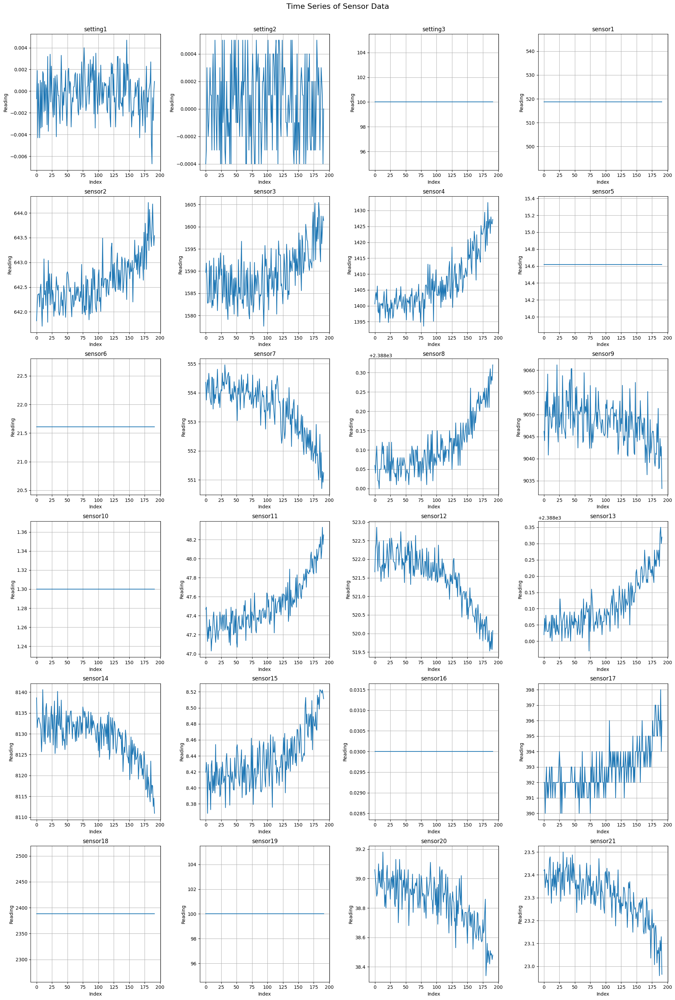

In [30]:
sensor_columns = columns[2:]
num_sensors = len(sensor_columns)
n_cols = 4  # Set a fixed number of columns
n_rows = math.ceil(num_sensors / n_cols)

plt.figure(figsize=(n_cols * 5, n_rows * 5))

sample = 1 # sample engine
sample_df = train_FD001_df[train_FD001_df['engine'] == sample].copy()

for i, sensor in enumerate(sensor_columns):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.plot(sample_df.index, sample_df[sensor], label=sensor)
    plt.xlabel('Index')
    plt.ylabel('Reading')
    plt.title(sensor)
    plt.grid(True)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.suptitle('Time Series of Sensor Data', fontsize=16)
plt.show()

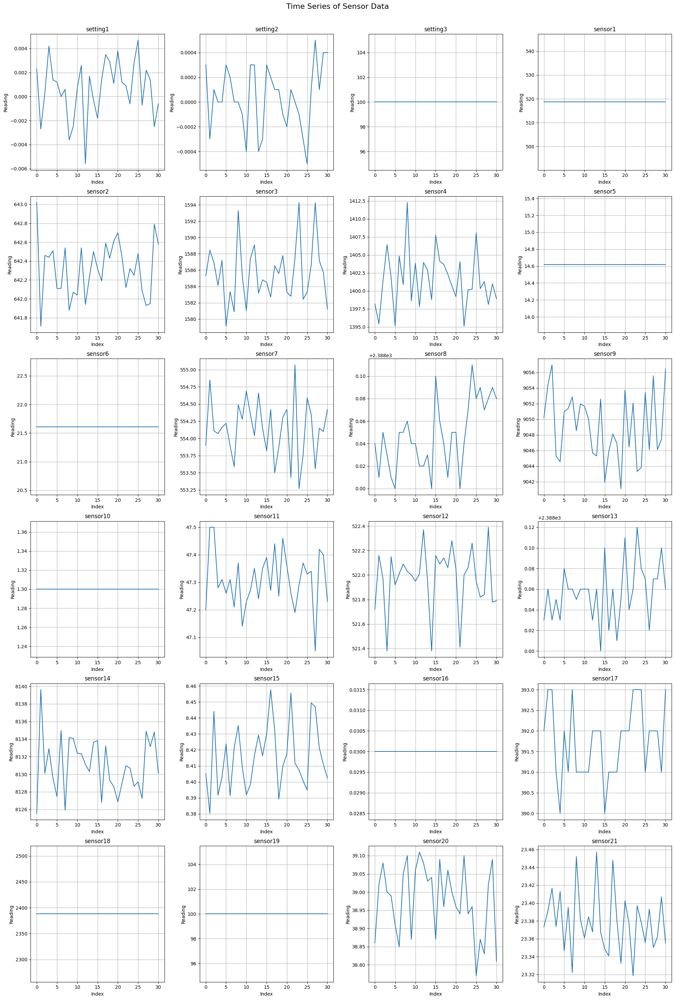

In [31]:
sensor_columns = columns[2:]
num_sensors = len(sensor_columns)
n_cols = 4  # Set a fixed number of columns
n_rows = math.ceil(num_sensors / n_cols)

plt.figure(figsize=(n_cols * 5, n_rows * 5))

sample = 1
sample_df = test_FD001_df[test_FD001_df['engine'] == sample].copy()

for i, sensor in enumerate(sensor_columns):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.plot(sample_df.index, sample_df[sensor], label=sensor)
    plt.xlabel('Index')
    plt.ylabel('Reading')
    plt.title(sensor)
    plt.grid(True)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.suptitle('Time Series of Sensor Data', fontsize=16)
plt.show()

## Analyse Data (Descriptive Statistics)

In [32]:
train_FD001_df.describe()

,engine,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20631.00,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,518.67,642.680934,1590.523119,1408.933782,1.462000e+01,...,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,0.00,0.500053,6.131150,9.000605,1.776400e-15,...,0.737553,0.071919,19.076176,0.037505,1.387812e-17,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,518.67,641.210000,1571.040000,1382.250000,1.462000e+01,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,518.67,642.325000,1586.260000,1402.360000,1.462000e+01,...,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,518.67,642.640000,1590.100000,1408.040000,1.462000e+01,...,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,518.67,643.000000,1594.380000,1414.555000,1.462000e+01,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,518.67,644.530000,1616.910000,1441.490000,1.462000e+01,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


In [33]:
static_column= ['setting3','sensor1','sensor5','sensor6','sensor10','sensor16','sensor18','sensor19']
train_FD001_df[static_column].describe()

,setting3,sensor1,sensor5,sensor6,sensor10,sensor16,sensor18,sensor19
count,20631.0,20631.00,2.063100e+04,20631.000000,20631.0,2.063100e+04,20631.0,20631.0
mean,100.0,518.67,1.462000e+01,21.609803,1.3,3.000000e-02,2388.0,100.0
std,0.0,0.00,1.776400e-15,0.001389,0.0,1.387812e-17,0.0,0.0
min,100.0,518.67,1.462000e+01,21.600000,1.3,3.000000e-02,2388.0,100.0
25%,100.0,518.67,1.462000e+01,21.610000,1.3,3.000000e-02,2388.0,100.0
50%,100.0,518.67,1.462000e+01,21.610000,1.3,3.000000e-02,2388.0,100.0
75%,100.0,518.67,1.462000e+01,21.610000,1.3,3.000000e-02,2388.0,100.0
max,100.0,518.67,1.462000e+01,21.610000,1.3,3.000000e-02,2388.0,100.0


## Drop Static Columns

In [34]:
# drop columns
train_FD001_clean = train_FD001_df.drop(static_column, axis = 1)
test_FD001_clean = test_FD001_df.drop(static_column, axis = 1)

train_FD002_clean = train_FD002_df.drop(static_column, axis = 1)
test_FD002_clean = test_FD002_df.drop(static_column, axis = 1)

train_FD003_clean = train_FD003_df.drop(static_column, axis = 1)
test_FD003_clean = test_FD003_df.drop(static_column, axis = 1)

train_FD004_clean = train_FD004_df.drop(static_column, axis = 1)
test_FD004_clean = test_FD004_df.drop(static_column, axis = 1)

In [35]:
train_FD001_clean.head()

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044


In [36]:
train_FD001_clean.columns[2:-1]

Index(['setting1', 'setting2', 'sensor2', 'sensor3', 'sensor4', 'sensor7',
       'sensor8', 'sensor9', 'sensor11', 'sensor12', 'sensor13', 'sensor14',
       'sensor15', 'sensor17', 'sensor20'],
      dtype='object')

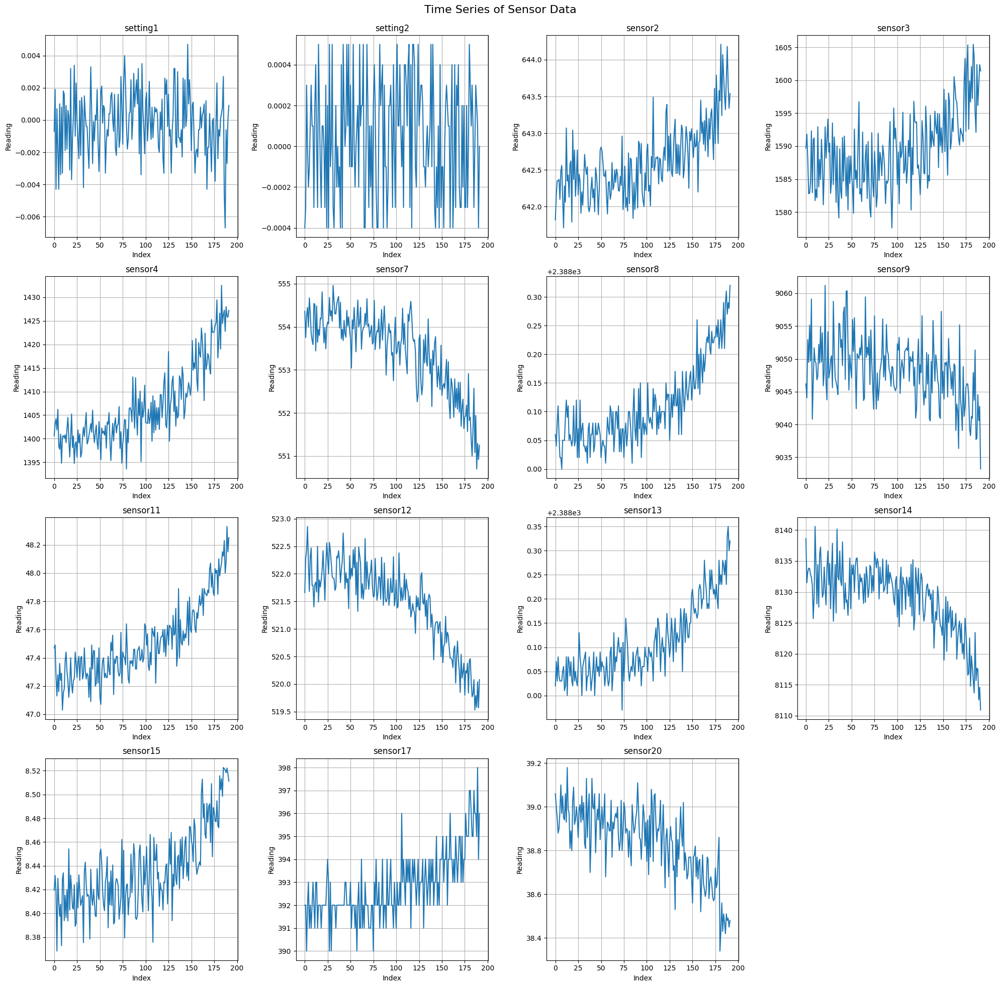

In [37]:
# Select all sensor columns, excluding the first two columns and the last column
sensor_columns = train_FD001_clean.columns[2:-1]

# Count the number of sensor columns
num_sensors = len(sensor_columns)

# Set a fixed number of columns for the subplot layout
n_cols = 4

# Calculate the number of rows needed based on the number of sensor columns
n_rows = math.ceil(num_sensors / n_cols)

# Set the figure size based on the number of rows and columns
plt.figure(figsize=(n_cols * 5, n_rows * 5))

# Select data for a specific engine (e.g., engine 1) from the cleaned training dataset
sample = 1
sample_df = train_FD001_clean[train_FD001_clean['engine'] == sample].copy()

# Loop through each sensor column and plot its time series data for the selected engine
for i, sensor in enumerate(sensor_columns):
    plt.subplot(n_rows, n_cols, i + 1)  # Create a subplot for each sensor
    plt.plot(sample_df.index, sample_df[sensor], label=sensor)  # Plot the sensor data for the selected engine
    plt.xlabel('Index')  # Label the x-axis as 'Index'
    plt.ylabel('Reading')  # Label the y-axis as 'Reading'
    plt.title(sensor)  # Set the title of the subplot to the sensor name
    plt.grid(True)  # Add a grid to the subplot for better readability

# Adjust layout to prevent overlapping and improve the appearance
plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust the top of the subplots to make room for the main title

# Add a main title for the entire figure
plt.suptitle('Time Series of Sensor Data', fontsize=16)

# Display the plot
plt.show()

## Compute Train DataSet RUL Label

In [38]:
def compute_train_rul(df):
    rul_list = []
    max_len = max(df['engine'])
    for n in np.arange(1, max_len+1):
        time_list = np.array(df[df['engine'] == n]['cycle'])
        length = len(time_list)
        rul = list(length - time_list)
        rul_list += rul
    df['rul'] = rul_list
    return df

train_FD001_clean = compute_train_rul(train_FD001_clean)
train_FD002_clean = compute_train_rul(train_FD002_clean)
train_FD003_clean = compute_train_rul(train_FD003_clean)
train_FD004_clean = compute_train_rul(train_FD004_clean)

In [39]:
train_FD001_clean[train_FD001_clean['engine'] == 1]['cycle']

,cycle
0,1
1,2
2,3
3,4
4,5
...,...
187,188
188,189
189,190
190,191


In [40]:
train_FD001_clean.head(5)

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,191
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,190
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,189
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,187


In [41]:
train_FD002_clean.head(5)

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,34.9983,0.8400,555.32,1358.61,1137.23,194.64,2222.65,8341.91,42.02,183.06,2387.72,8048.56,9.3461,334,14.73,8.8071,148
1,1,2,41.9982,0.8408,549.90,1353.22,1125.78,138.51,2211.57,8303.96,42.20,130.42,2387.66,8072.30,9.3774,330,10.41,6.2665,147
2,1,3,24.9988,0.6218,537.31,1256.76,1047.45,175.71,1915.11,8001.42,36.69,164.22,2028.03,7864.87,10.8941,309,14.08,8.6723,146
3,1,4,42.0077,0.8416,549.51,1354.03,1126.38,138.46,2211.58,8303.96,41.96,130.72,2387.61,8068.66,9.3528,329,10.59,6.4701,145
4,1,5,25.0005,0.6203,537.07,1257.71,1047.93,175.05,1915.10,7993.23,36.89,164.31,2028.00,7861.23,10.8963,309,14.13,8.5286,144


In [42]:
train_FD003_clean.head(5)

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,-0.0005,0.0004,642.36,1583.23,1396.84,553.97,2387.96,9062.17,47.30,522.31,2388.01,8145.32,8.4246,391,39.11,23.3537,258
1,1,2,0.0008,-0.0003,642.50,1584.69,1396.89,554.55,2388.00,9061.78,47.23,522.42,2388.03,8152.85,8.4403,392,38.99,23.4491,257
2,1,3,-0.0014,-0.0002,642.18,1582.35,1405.61,554.43,2388.03,9070.23,47.22,522.03,2388.00,8150.17,8.3901,391,38.85,23.3669,256
3,1,4,-0.0020,0.0001,642.92,1585.61,1392.27,555.21,2388.00,9064.57,47.24,522.49,2388.08,8146.56,8.3878,392,38.96,23.2951,255
4,1,5,0.0016,0.0000,641.68,1588.63,1397.65,554.74,2388.04,9076.14,47.15,522.58,2388.03,8147.80,8.3869,392,39.14,23.4583,254


In [43]:
train_FD004_clean.head(5)

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,41.69,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670,320
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,43.94,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552,319
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,41.66,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213,318
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,41.68,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176,317
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,36.48,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754,316


## Min-Max Scale Sensor Values

In [44]:
def scale_sensor_values(df, sensor_prefix='sensor'):
    sensor_columns = [col for col in df.columns if col.startswith(sensor_prefix)]
    scaler = MinMaxScaler()
    df[sensor_columns] = scaler.fit_transform(df[sensor_columns])
    return df

train_FD001_scaled = scale_sensor_values(train_FD001_clean)
test_FD001_scaled = scale_sensor_values(test_FD001_clean)

train_FD002_scaled = scale_sensor_values(train_FD002_clean)
test_FD002_scaled = scale_sensor_values(test_FD002_clean)

train_FD003_scaled = scale_sensor_values(train_FD003_clean)
test_FD003_scaled = scale_sensor_values(test_FD003_clean)

train_FD004_scaled = scale_sensor_values(train_FD004_clean)
test_FD004_scaled = scale_sensor_values(test_FD004_clean)

In [45]:
train_FD001_scaled.head()

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,-0.0007,-0.0004,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662,191
1,1,2,0.0019,-0.0003,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,0.380952,0.765458,0.279412,0.162813,0.411312,0.333333,0.666667,0.731014,190
2,1,3,-0.0043,0.0003,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,0.250000,0.795309,0.220588,0.171793,0.357445,0.166667,0.627907,0.621375,189
3,1,4,0.0007,0.0000,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,0.166667,0.889126,0.294118,0.174889,0.166603,0.333333,0.573643,0.662386,188
4,1,5,-0.0019,-0.0002,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,0.255952,0.746269,0.235294,0.174734,0.402078,0.416667,0.589147,0.704502,187


## Apply exponential weighted moving averages on setting and sensor readings

In [46]:
# Function to compute EWMA for each engine's sensor and setting data separately
def apply_ewma_per_engine(df, alpha=0.3, setting_prefix='setting', sensor_prefix='sensor'):
    ewma_columns = [col for col in df.columns if col.startswith(setting_prefix) or col.startswith(sensor_prefix)]
    smoothed_df = df.copy()

    for engine in df['engine'].unique():
        engine_data = df[df['engine'] == engine]

        for col in ewma_columns:
            smoothed_values = engine_data[col].ewm(alpha=alpha).mean()
            smoothed_df.loc[df['engine'] == engine, col + '_smoothed'] = smoothed_values

    return smoothed_df

In [47]:
# Apply EWMA to each sensor for each engine
train_FD001_ewma = apply_ewma_per_engine(train_FD001_scaled, alpha=0.099)
test_FD001_ewma = apply_ewma_per_engine(test_FD001_scaled, alpha=0.099)

train_FD002_ewma = apply_ewma_per_engine(train_FD002_scaled, alpha=0.099)
test_FD002_ewma = apply_ewma_per_engine(test_FD002_scaled, alpha=0.099)

train_FD003_ewma = apply_ewma_per_engine(train_FD003_scaled, alpha=0.099)
test_FD003_ewma = apply_ewma_per_engine(test_FD003_scaled, alpha=0.099)

train_FD004_ewma = apply_ewma_per_engine(train_FD004_scaled, alpha=0.099)
test_FD004_ewma = apply_ewma_per_engine(test_FD004_scaled, alpha=0.099)

In [48]:
train_FD001_ewma.head()

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,...,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed
0,1,1,-0.0007,-0.0004,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,...,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662
1,1,2,0.0019,-0.0003,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,...,0.226484,0.104751,0.375310,0.702803,0.244562,0.180253,0.388881,0.333333,0.688711,0.728003
2,1,3,-0.0043,0.0003,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,...,0.243530,0.117760,0.329118,0.736903,0.235725,0.177134,0.377293,0.271896,0.666297,0.688698
3,1,4,0.0007,0.0000,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,...,0.265205,0.119722,0.281952,0.781099,0.252678,0.176482,0.316121,0.289734,0.639396,0.681058
4,1,5,-0.0019,-0.0002,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,...,0.259653,0.127091,0.275615,0.772611,0.248442,0.176056,0.337070,0.320669,0.627150,0.686772


## Smoothed_data visualization

In [49]:
def viz_normal_ewma(df_norm, df_ewma):
    # Define the sensor columns
    sensor_columns = df_norm.columns[2:-1]  # Assuming the first two columns are 'engine' and 'cycle'
    num_sensors = len(sensor_columns)
    n_cols = 4
    n_rows = math.ceil(num_sensors / n_cols)

    plt.figure(figsize=(n_cols * 5, n_rows * 5))

    # Select a sample engine for demonstration
    sample_engine = 1
    sample_df = df_norm[df_norm['engine'] == sample_engine].copy()
    ewma_sample_df = df_ewma[df_ewma['engine'] == sample_engine].copy()

    # Plot original and EWMA data
    for i, sensor in enumerate(sensor_columns):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.plot(sample_df.index, sample_df[sensor], label='Original ' + sensor, color='blue', alpha=0.6)
        plt.plot(ewma_sample_df.index, ewma_sample_df[sensor + '_smoothed'], label='EWMA ' + sensor, linestyle='--', color='red', alpha=0.8)
        plt.xlabel('Index')
        plt.ylabel('Reading')
        plt.title(sensor)
        plt.grid(True)
        plt.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.suptitle(f'Time Series of Sensor Data for Engine {sample_engine}', fontsize=16)
    plt.show()

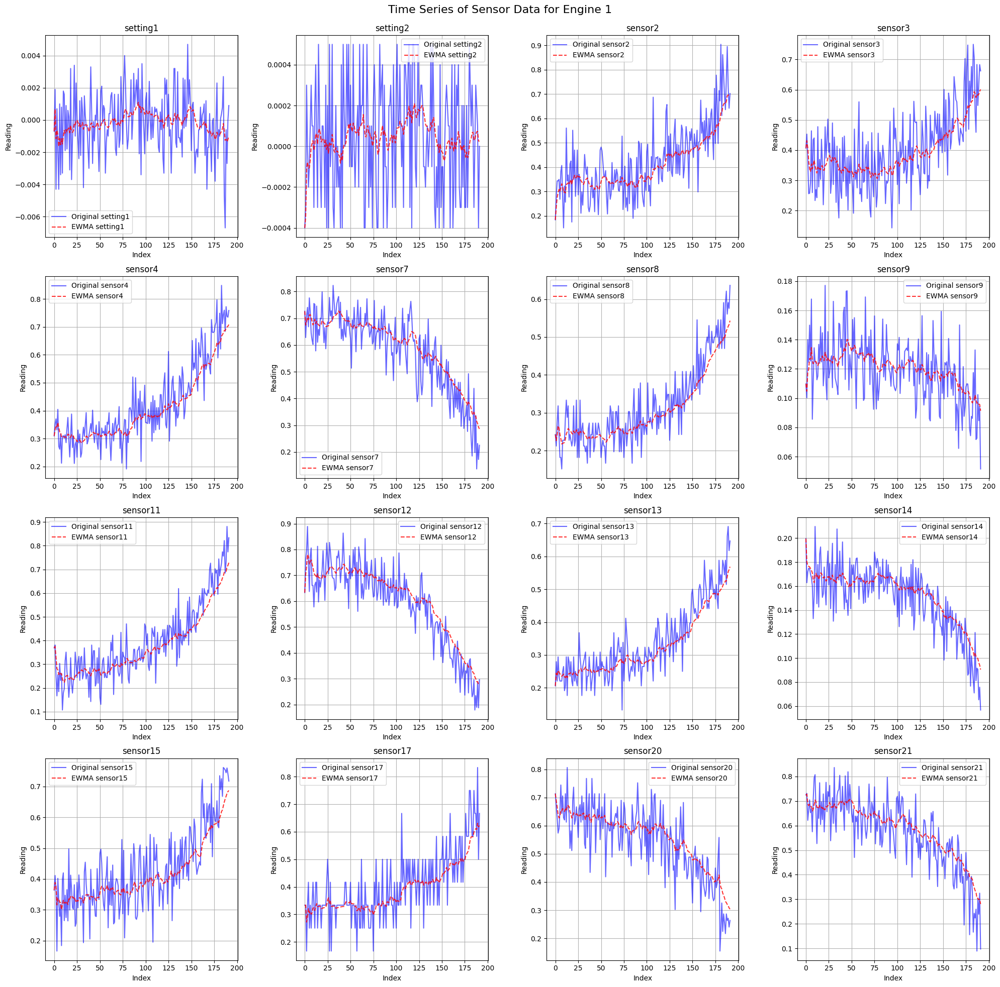

In [50]:
viz_normal_ewma(train_FD001_clean, train_FD001_ewma)

In [120]:
def drop_non_smoothed_columns(df, keep_columns=['engine', 'cycle'], suffix='_smoothed'):
    columns_to_keep = [col for col in df.columns if suffix in col or col in keep_columns]
    df_smoothed = df[columns_to_keep]
    return df_smoothed

train_FD001_scaled_ewma = drop_non_smoothed_columns(train_FD001_ewma)
test_FD001_scaled_ewma = drop_non_smoothed_columns(test_FD001_ewma)

train_FD002_scaled_ewma = drop_non_smoothed_columns(train_FD002_ewma)
test_FD002_scaled_ewma = drop_non_smoothed_columns(test_FD002_ewma)

train_FD003_scaled_ewma = drop_non_smoothed_columns(train_FD003_ewma)
test_FD003_scaled_ewma = drop_non_smoothed_columns(test_FD003_ewma)

train_FD004_scaled_ewma = drop_non_smoothed_columns(train_FD004_ewma)
test_FD004_scaled_ewma = drop_non_smoothed_columns(test_FD004_ewma)

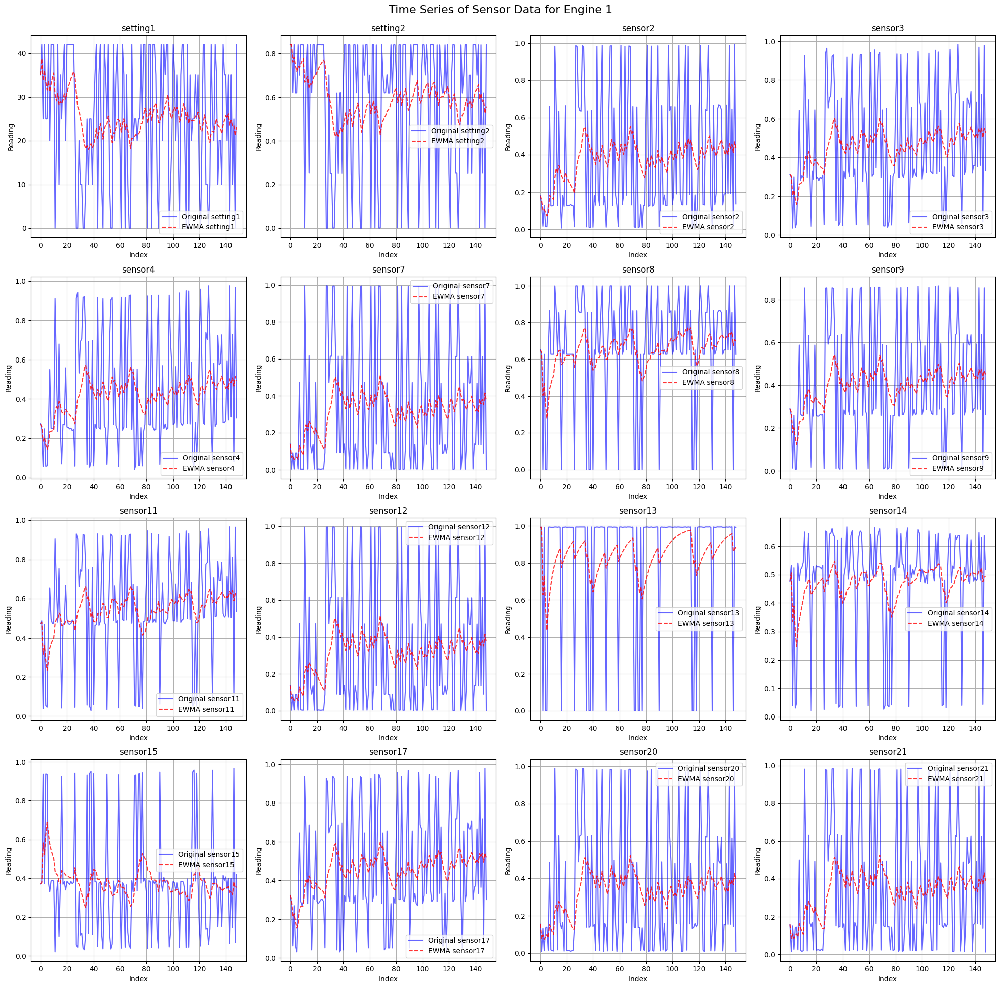

In [121]:
viz_normal_ewma(train_FD002_clean, train_FD002_scaled_ewma)

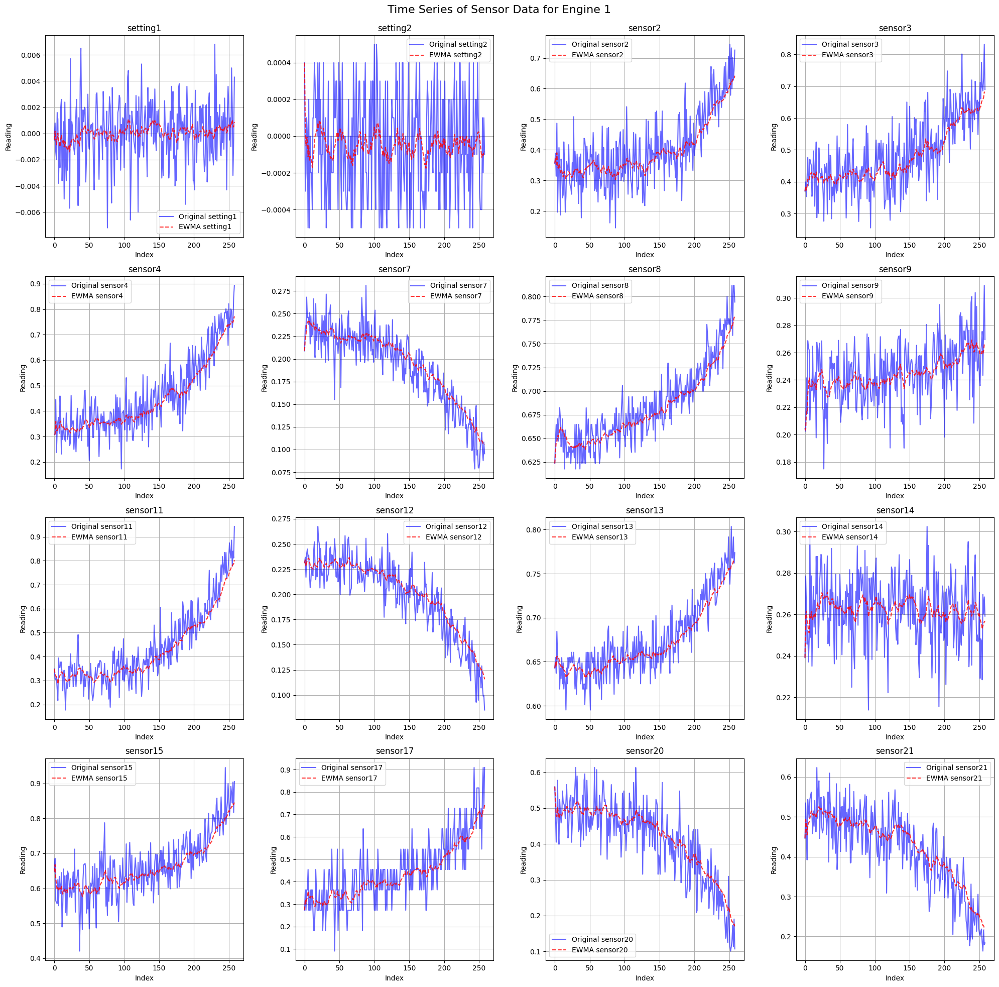

In [122]:
viz_normal_ewma(train_FD003_clean, train_FD003_scaled_ewma)

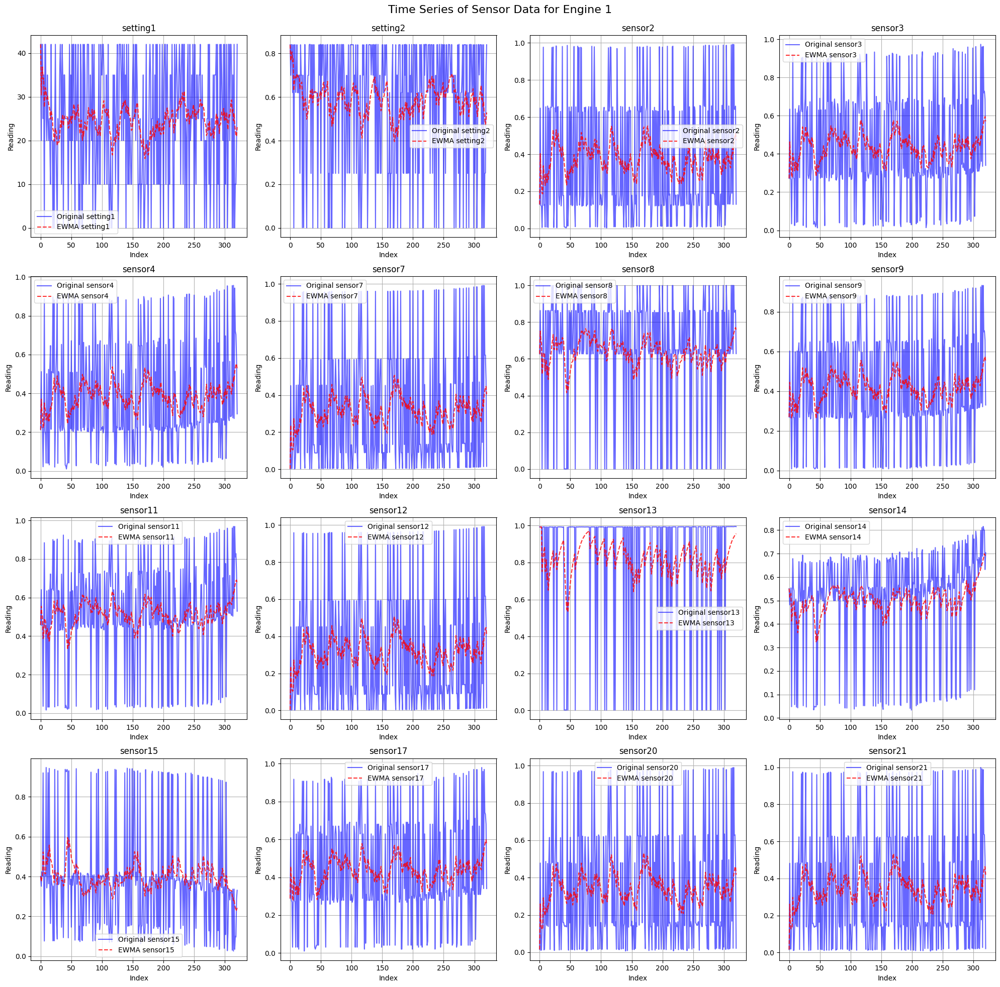

In [123]:
viz_normal_ewma(train_FD004_clean, train_FD004_scaled_ewma)

## Select training Data

In [124]:
train_FD001_scaled

,engine,cycle,setting1,setting2,sensor2,sensor3,sensor4,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21,rul
0,1,1,-0.0007,-0.0004,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662,191
1,1,2,0.0019,-0.0003,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,0.380952,0.765458,0.279412,0.162813,0.411312,0.333333,0.666667,0.731014,190
2,1,3,-0.0043,0.0003,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,0.250000,0.795309,0.220588,0.171793,0.357445,0.166667,0.627907,0.621375,189
3,1,4,0.0007,0.0000,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,0.166667,0.889126,0.294118,0.174889,0.166603,0.333333,0.573643,0.662386,188
4,1,5,-0.0019,-0.0002,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,0.255952,0.746269,0.235294,0.174734,0.402078,0.416667,0.589147,0.704502,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,0.686747,0.587312,0.782917,0.254428,0.439394,0.196491,0.726190,0.170576,0.558824,0.194344,0.656791,0.750000,0.271318,0.109500,4
20627,100,197,-0.0016,-0.0005,0.701807,0.729453,0.866475,0.162641,0.500000,0.194651,0.708333,0.211087,0.500000,0.188668,0.727203,0.583333,0.124031,0.366197,3
20628,100,198,0.0004,0.0000,0.665663,0.684979,0.775321,0.175523,0.515152,0.198196,0.738095,0.281450,0.529412,0.212148,0.922278,0.833333,0.232558,0.053991,2
20629,100,199,-0.0011,0.0003,0.608434,0.746021,0.747468,0.133655,0.530303,0.233285,0.916667,0.208955,0.514706,0.203065,0.823394,0.583333,0.116279,0.234466,1


In [52]:
# Prepare input and output train data

X_train_FD001 = train_FD001_scaled_ewma
y_train_FD001 = train_FD001_scaled['rul']

X_train_FD002 = train_FD002_scaled_ewma
y_train_FD002 = train_FD002_scaled['rul']

X_train_FD003 = train_FD003_scaled_ewma
y_train_FD003 = train_FD003_scaled['rul']

X_train_FD004 = train_FD004_scaled_ewma
y_train_FD004 = train_FD004_scaled['rul']

In [126]:
def process_test_rul(df_test, y_test):
    df_test = df_test.copy()
    # Initialize an empty list to store the calculated RUL values
    rul_list = []

    # Process the RUL column for each engine in the test dataset
    for n in np.arange(1, len(y_test)+1):
        time_list = np.array(df_test[df_test['engine'] == n]['cycle'])
        length = len(time_list)
        rul_val = y_test.iloc[n-1].item()
        rul = list(length - time_list + rul_val)
        rul_list += rul

    df_test['rul'] = rul_list
    return df_test

# Example usage
df_test_FD001 = process_test_rul(test_FD001_scaled_ewma, rul_FD001_df)
df_test_FD002 = process_test_rul(test_FD002_scaled_ewma, rul_FD002_df)
df_test_FD003 = process_test_rul(test_FD003_scaled_ewma, rul_FD003_df)
df_test_FD004 = process_test_rul(test_FD004_scaled_ewma, rul_FD004_df)

In [127]:
rul_FD001_df

,rul
0,112
1,98
2,69
3,82
4,91
...,...
95,137
96,82
97,59
98,117


In [128]:
df_test_FD001

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed,rul
0,1,1,0.002300,0.000300,0.596215,0.421968,0.282214,0.608871,0.365854,0.196475,0.273973,0.534247,0.325581,0.152259,0.347076,0.375000,0.500000,0.620099,142
1,1,2,-0.000330,-0.000016,0.378829,0.465133,0.252243,0.709624,0.327363,0.213607,0.382063,0.587091,0.362282,0.218355,0.284284,0.440755,0.576515,0.633576,141
2,1,3,-0.000098,0.000027,0.393843,0.465016,0.286852,0.688091,0.350542,0.226471,0.417963,0.588651,0.348753,0.208968,0.376172,0.462594,0.622034,0.651096,140
3,1,4,0.001150,0.000019,0.399477,0.443696,0.334182,0.675042,0.347906,0.206905,0.392066,0.550318,0.355530,0.211561,0.348934,0.400869,0.623555,0.642178,139
4,1,5,0.001211,0.000014,0.408215,0.450425,0.339980,0.671690,0.334448,0.193868,0.381647,0.570327,0.348231,0.205792,0.346028,0.333638,0.622246,0.650423,138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,194,-0.000037,0.000136,0.560859,0.647446,0.599003,0.504197,0.374500,0.789194,0.548021,0.462893,0.358134,0.813501,0.576011,0.627683,0.416873,0.486178,24
13092,100,195,-0.000142,0.000113,0.570605,0.651859,0.615837,0.500987,0.376058,0.799178,0.548013,0.454813,0.368725,0.823451,0.575178,0.639793,0.399003,0.485928,23
13093,100,196,-0.000187,0.000072,0.586257,0.649306,0.600215,0.494503,0.391950,0.812823,0.545972,0.450472,0.366756,0.838065,0.577132,0.650703,0.387402,0.475614,22
13094,100,197,-0.000545,0.000075,0.594738,0.651736,0.611491,0.495246,0.396611,0.826665,0.546846,0.449950,0.374192,0.854096,0.585632,0.660533,0.380549,0.475400,21


In [129]:
test_FD001_scaled_ewma

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed
0,1,1,0.002300,0.000300,0.596215,0.421968,0.282214,0.608871,0.365854,0.196475,0.273973,0.534247,0.325581,0.152259,0.347076,0.375000,0.500000,0.620099
1,1,2,-0.000330,-0.000016,0.378829,0.465133,0.252243,0.709624,0.327363,0.213607,0.382063,0.587091,0.362282,0.218355,0.284284,0.440755,0.576515,0.633576
2,1,3,-0.000098,0.000027,0.393843,0.465016,0.286852,0.688091,0.350542,0.226471,0.417963,0.588651,0.348753,0.208968,0.376172,0.462594,0.622034,0.651096
3,1,4,0.001150,0.000019,0.399477,0.443696,0.334182,0.675042,0.347906,0.206905,0.392066,0.550318,0.355530,0.211561,0.348934,0.400869,0.623555,0.642178
4,1,5,0.001211,0.000014,0.408215,0.450425,0.339980,0.671690,0.334448,0.193868,0.381647,0.570327,0.348231,0.205792,0.346028,0.333638,0.622246,0.650423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,194,-0.000037,0.000136,0.560859,0.647446,0.599003,0.504197,0.374500,0.789194,0.548021,0.462893,0.358134,0.813501,0.576011,0.627683,0.416873,0.486178
13092,100,195,-0.000142,0.000113,0.570605,0.651859,0.615837,0.500987,0.376058,0.799178,0.548013,0.454813,0.368725,0.823451,0.575178,0.639793,0.399003,0.485928
13093,100,196,-0.000187,0.000072,0.586257,0.649306,0.600215,0.494503,0.391950,0.812823,0.545972,0.450472,0.366756,0.838065,0.577132,0.650703,0.387402,0.475614
13094,100,197,-0.000545,0.000075,0.594738,0.651736,0.611491,0.495246,0.396611,0.826665,0.546846,0.449950,0.374192,0.854096,0.585632,0.660533,0.380549,0.475400


In [130]:
rul_FD001_df

,rul
0,112
1,98
2,69
3,82
4,91
...,...
95,137
96,82
97,59
98,117


In [131]:
df_test_FD001

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed,rul
0,1,1,0.002300,0.000300,0.596215,0.421968,0.282214,0.608871,0.365854,0.196475,0.273973,0.534247,0.325581,0.152259,0.347076,0.375000,0.500000,0.620099,142
1,1,2,-0.000330,-0.000016,0.378829,0.465133,0.252243,0.709624,0.327363,0.213607,0.382063,0.587091,0.362282,0.218355,0.284284,0.440755,0.576515,0.633576,141
2,1,3,-0.000098,0.000027,0.393843,0.465016,0.286852,0.688091,0.350542,0.226471,0.417963,0.588651,0.348753,0.208968,0.376172,0.462594,0.622034,0.651096,140
3,1,4,0.001150,0.000019,0.399477,0.443696,0.334182,0.675042,0.347906,0.206905,0.392066,0.550318,0.355530,0.211561,0.348934,0.400869,0.623555,0.642178,139
4,1,5,0.001211,0.000014,0.408215,0.450425,0.339980,0.671690,0.334448,0.193868,0.381647,0.570327,0.348231,0.205792,0.346028,0.333638,0.622246,0.650423,138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,194,-0.000037,0.000136,0.560859,0.647446,0.599003,0.504197,0.374500,0.789194,0.548021,0.462893,0.358134,0.813501,0.576011,0.627683,0.416873,0.486178,24
13092,100,195,-0.000142,0.000113,0.570605,0.651859,0.615837,0.500987,0.376058,0.799178,0.548013,0.454813,0.368725,0.823451,0.575178,0.639793,0.399003,0.485928,23
13093,100,196,-0.000187,0.000072,0.586257,0.649306,0.600215,0.494503,0.391950,0.812823,0.545972,0.450472,0.366756,0.838065,0.577132,0.650703,0.387402,0.475614,22
13094,100,197,-0.000545,0.000075,0.594738,0.651736,0.611491,0.495246,0.396611,0.826665,0.546846,0.449950,0.374192,0.854096,0.585632,0.660533,0.380549,0.475400,21


In [132]:
df_test_FD001[df_test_FD001['engine'] == 3]

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed,rul
80,3,1,-0.000100,1.000000e-04,0.283912,0.542197,0.490096,0.508065,0.439024,0.223142,0.623288,0.643836,0.558140,0.202447,0.480345,0.375000,0.618182,0.510403,194
81,3,2,0.002004,-1.104156e-04,0.317100,0.643143,0.484832,0.544124,0.490345,0.174125,0.526006,0.522534,0.496972,0.209587,0.443275,0.440755,0.546449,0.527603,193
82,3,3,0.001487,4.087292e-05,0.415337,0.575780,0.480675,0.518197,0.462436,0.191460,0.483597,0.543684,0.485229,0.207350,0.401629,0.370438,0.472358,0.563734,192
83,3,4,0.000736,-2.817169e-08,0.412899,0.570553,0.442086,0.509987,0.462720,0.194829,0.514212,0.532326,0.479390,0.214327,0.433948,0.480640,0.443431,0.577674,191
84,3,5,0.000459,-7.313400e-05,0.416059,0.520419,0.441245,0.519837,0.510443,0.203690,0.512418,0.513320,0.475911,0.219876,0.469790,0.454895,0.446140,0.557589,190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,3,122,0.000286,-1.503451e-04,0.548119,0.629578,0.590437,0.433096,0.627190,0.200774,0.596161,0.383175,0.614314,0.185736,0.633122,0.544883,0.439453,0.433771,73
202,3,123,-0.000306,-1.156608e-04,0.537890,0.637817,0.583192,0.426945,0.639952,0.197815,0.596134,0.371234,0.615659,0.182767,0.634465,0.552814,0.426547,0.432530,72
203,3,124,-0.000385,-7.451029e-05,0.544913,0.629816,0.582850,0.413020,0.634548,0.195915,0.592042,0.368160,0.616872,0.186872,0.629696,0.572336,0.417619,0.431733,71
204,3,125,-0.000208,-4.733372e-05,0.556863,0.617851,0.582179,0.416442,0.644167,0.194415,0.589032,0.348664,0.629476,0.185629,0.628104,0.577550,0.398774,0.429853,70


## Preprocess and windorize training, validation and test data

In [133]:
X_train_FD001

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed
0,1,1,-0.000700,-0.000400,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662
1,1,2,0.000668,-0.000347,0.236022,0.431114,0.332312,0.674576,0.226484,0.104751,0.375310,0.702803,0.244562,0.180253,0.388881,0.333333,0.688711,0.728003
2,1,3,-0.001164,-0.000109,0.275594,0.408410,0.346399,0.687687,0.243530,0.117760,0.329118,0.736903,0.235725,0.177134,0.377293,0.271896,0.666297,0.688698
3,1,4,-0.000622,-0.000077,0.295273,0.364205,0.341984,0.703091,0.265205,0.119722,0.281952,0.781099,0.252678,0.176482,0.316121,0.289734,0.639396,0.681058
4,1,5,-0.000934,-0.000107,0.308464,0.338192,0.357251,0.694606,0.259653,0.127091,0.275615,0.772611,0.248442,0.176056,0.337070,0.320669,0.627150,0.686772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.000076,0.000006,0.659203,0.606435,0.714830,0.302083,0.472607,0.202250,0.710979,0.291410,0.506636,0.213134,0.695133,0.635166,0.260053,0.299252
20627,100,197,-0.000227,-0.000044,0.663421,0.618613,0.729843,0.288279,0.475319,0.201498,0.710717,0.283458,0.505979,0.210712,0.698308,0.630035,0.246587,0.305879
20628,100,198,-0.000165,-0.000040,0.663643,0.625184,0.734345,0.277116,0.479262,0.201171,0.713427,0.283259,0.508299,0.210854,0.720481,0.650161,0.245198,0.280942
20629,100,199,-0.000257,-0.000006,0.658177,0.637147,0.735644,0.262913,0.484315,0.204350,0.733548,0.275903,0.508933,0.210083,0.730669,0.643545,0.232435,0.276341


In [134]:
X_train_FD001.groupby('engine')['cycle'].max().describe()

,cycle
count,100.000000
mean,206.310000
std,46.342749
min,128.000000
25%,177.000000
50%,199.000000
75%,229.250000
max,362.000000


from test description, the minimum train window size cannot be more than 31.

Considering the EWA takes about 10 steps to warm up (these data points still constistute some level of noise). A logical window size will now be 31-10=21, therefore 20 seems like a resonable window size for FD001

# Deep learning RUL models

## Tensoflow

In [135]:
X_train_FD001_copy = X_train_FD001.copy()
X_train_FD001_copy['rul'] = y_train_FD001

In [136]:
df_test_FD001

,engine,cycle,setting1_smoothed,setting2_smoothed,sensor2_smoothed,sensor3_smoothed,sensor4_smoothed,sensor7_smoothed,sensor8_smoothed,sensor9_smoothed,sensor11_smoothed,sensor12_smoothed,sensor13_smoothed,sensor14_smoothed,sensor15_smoothed,sensor17_smoothed,sensor20_smoothed,sensor21_smoothed,rul
0,1,1,0.002300,0.000300,0.596215,0.421968,0.282214,0.608871,0.365854,0.196475,0.273973,0.534247,0.325581,0.152259,0.347076,0.375000,0.500000,0.620099,142
1,1,2,-0.000330,-0.000016,0.378829,0.465133,0.252243,0.709624,0.327363,0.213607,0.382063,0.587091,0.362282,0.218355,0.284284,0.440755,0.576515,0.633576,141
2,1,3,-0.000098,0.000027,0.393843,0.465016,0.286852,0.688091,0.350542,0.226471,0.417963,0.588651,0.348753,0.208968,0.376172,0.462594,0.622034,0.651096,140
3,1,4,0.001150,0.000019,0.399477,0.443696,0.334182,0.675042,0.347906,0.206905,0.392066,0.550318,0.355530,0.211561,0.348934,0.400869,0.623555,0.642178,139
4,1,5,0.001211,0.000014,0.408215,0.450425,0.339980,0.671690,0.334448,0.193868,0.381647,0.570327,0.348231,0.205792,0.346028,0.333638,0.622246,0.650423,138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13091,100,194,-0.000037,0.000136,0.560859,0.647446,0.599003,0.504197,0.374500,0.789194,0.548021,0.462893,0.358134,0.813501,0.576011,0.627683,0.416873,0.486178,24
13092,100,195,-0.000142,0.000113,0.570605,0.651859,0.615837,0.500987,0.376058,0.799178,0.548013,0.454813,0.368725,0.823451,0.575178,0.639793,0.399003,0.485928,23
13093,100,196,-0.000187,0.000072,0.586257,0.649306,0.600215,0.494503,0.391950,0.812823,0.545972,0.450472,0.366756,0.838065,0.577132,0.650703,0.387402,0.475614,22
13094,100,197,-0.000545,0.000075,0.594738,0.651736,0.611491,0.495246,0.396611,0.826665,0.546846,0.449950,0.374192,0.854096,0.585632,0.660533,0.380549,0.475400,21


In [137]:
# Seed for reproducibility
tf.random.set_seed(5)
np.random.seed(5)

In [138]:
# Prepare training and validation data
def prepare_train_val_data(df_train, train_units, val_units, window_size=20):
    train_data = df_train[df_train['engine'].isin(train_units)].copy()
    val_data = df_train[df_train['engine'].isin(val_units)].copy()

    train_indices = list(train_data[(train_data['rul'] >= (window_size - 1)) & (train_data['cycle'] > 10)].index)
    val_indices = list(val_data[(val_data['rul'] >= (window_size - 1)) & (val_data['cycle'] > 10)].index)

    X_train = []
    y_train = []
    for ind in train_indices:
        if ind + window_size <= len(train_data):
            X_ = train_data.iloc[ind:ind + window_size, :].drop(['cycle', 'engine', 'rul'], axis=1).to_numpy()
            y_ = train_data.iloc[ind + window_size - 1]['rul']
            X_train.append(X_)
            y_train.append(y_)

    X_val = []
    y_val = []
    for ind in val_indices:
        if ind + window_size <= len(val_data):
            X_ = val_data.iloc[ind:ind + window_size, :].drop(['cycle', 'engine', 'rul'], axis=1).to_numpy()
            y_ = val_data.iloc[ind + window_size - 1]['rul']
            X_val.append(X_)
            y_val.append(y_)

    return np.array(X_train), np.array(y_train), np.array(X_val), np.array(y_val)

# Prepare extended test data
def prepare_extended_test_data(df_test, window_size=20):
    X_test = []
    y_test_final = []

    for n in df_test['engine'].unique():
        U = df_test[df_test['engine'] == n].reset_index(drop=True)
        if len(U) < window_size:
            continue
        for start in range(len(U) - window_size + 1):
            end = start + window_size
            if end <= len(U):
                X_ = U.iloc[start:end, :].drop(['engine', 'cycle', 'rul'], axis=1).to_numpy()
                y_ = U.iloc[end - 1]['rul']
                X_test.append(X_)
                y_test_final.append(y_)

    return np.array(X_test), np.array(y_test_final)

# Prepare shortened test data
def prepare_shortened_test_data(df_test, window_size=20):
    units = np.arange(1, 101)
    X_test = []
    y_test_final = []

    for n in units:
        U = df_test[df_test['engine'] == n].reset_index(drop=True)
        if len(U) < window_size:
            continue
        X_ = U.iloc[-window_size:, :].drop(['engine', 'cycle', 'rul'], axis=1).to_numpy()
        y_ = U['rul'].min()
        X_test.append(X_)
        y_test_final.append(y_)

    return np.array(X_test), np.array(y_test_final)

In [139]:
# Use
train_units = np.random.choice(np.arange(1, 101), 80, replace=False)
val_units = np.setdiff1d(np.arange(1, 101), train_units)

X_train, y_train, X_val, y_val = prepare_train_val_data(X_train_FD001_copy, train_units, val_units)
X_test_extended, y_test_extended = prepare_extended_test_data(df_test_FD001)
X_test_shortened, y_test_shortened = prepare_shortened_test_data(df_test_FD001)

# Convert to TensorFlow Dataset
train_data_tf = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(64)
val_data_tf = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(64)
test_data_tf_extended = tf.data.Dataset.from_tensor_slices((X_test_extended, y_test_extended)).batch(64)
test_data_tf_shortened = tf.data.Dataset.from_tensor_slices((X_test_shortened, y_test_shortened)).batch(64)

In [140]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("X_test_extended shape:", X_test_extended.shape)
print("y_test_extended shape:", y_test_extended.shape)
print("X_test_shortened shape:", X_test_shortened.shape)
print("y_test_shortened shape:", y_test_shortened.shape)

X_train shape: (11415, 20, 16)
y_train shape: (11415,)
X_val shape: (720, 20, 16)
y_val shape: (720,)
X_test_extended shape: (11196, 20, 16)
y_test_extended shape: (11196,)
X_test_shortened shape: (100, 20, 16)
y_test_shortened shape: (100,)


In [141]:
# Build LSTM + CNN model
def build_lstm_cnn_model(input_shape, lstm_units=50, cnn_filters=32, cnn_kernel_size=3, dense_units=50, dropout_rate=0.2):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    lstm_out = tf.keras.layers.LSTM(units=lstm_units, return_sequences=True)(input_layer)
    lstm_out = tf.keras.layers.Dropout(rate=dropout_rate)(lstm_out)

    cnn_out = tf.keras.layers.Conv1D(filters=cnn_filters, kernel_size=cnn_kernel_size, activation='relu')(lstm_out)
    cnn_out = tf.keras.layers.MaxPooling1D(pool_size=2)(cnn_out)
    cnn_out = tf.keras.layers.Flatten()(cnn_out)

    dense_out = tf.keras.layers.Dense(units=dense_units, activation='relu')(cnn_out)
    dense_out = tf.keras.layers.Dropout(rate=dropout_rate)(dense_out)
    output_layer = tf.keras.layers.Dense(units=1)(dense_out)

    model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

    return model

def build_lstm_model(input_shape, lstm_units=50, dense_units=50, dropout_rate=0.2):
    input_layer = tf.keras.layers.Input(shape=input_shape)

    lstm_out = tf.keras.layers.LSTM(units=lstm_units, return_sequences=True)(input_layer)
    lstm_out = tf.keras.layers.Dropout(rate=dropout_rate)(lstm_out)

    lstm_out = tf.keras.layers.LSTM(units=lstm_units)(lstm_out)
    lstm_out = tf.keras.layers.Dropout(rate=dropout_rate)(lstm_out)

    dense_out = tf.keras.layers.Dense(units=dense_units, activation='relu')(lstm_out)
    dense_out = tf.keras.layers.Dropout(rate=dropout_rate)(dense_out)
    output_layer = tf.keras.layers.Dense(units=1)(dense_out)

    model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

    return model

# Plot training history
def plot_training_history(history):
    plt.figure(figsize=(14, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs', fontsize=16)
    plt.ylabel('Loss', fontsize=16)
    plt.title('Training and Validation Loss', fontsize=18)
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to compute metrics and get predictions
def compute_metrics(model, test_data_tf):
    y_true = []
    y_pred = []

    for x, y in test_data_tf:
        predictions = model.predict(x)
        y_true.extend(y.numpy())
        y_pred.extend(predictions.flatten())

    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f'RMSE: {rmse:.4f}, R2: {r2:.4f}')
    return rmse, r2, y_true, y_pred

# Plot predictions vs actual values for extended test data
def plot_predictions(y_test, y_pred, title):
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.plot(np.arange(1, len(y_test) + 1), y_pred, label='predictions', c='salmon')
    ax.plot(np.arange(1, len(y_test) + 1), y_test, label='true values', c='lightseagreen')
    ax.set_xlabel('Test Data Points', fontsize=16)
    ax.set_ylabel('RUL', fontsize=16)
    ax.grid(True)
    ax.legend()
    ax.set_title(title, fontsize=18)
    plt.show()

# Plot scatter of predictions vs actual values for test data
def plot_prediction_scatter(y_test, y_pred, title):
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.scatter(np.arange(1, len(y_test) + 1), y_pred, label='predictions', c='salmon')
    ax.scatter(np.arange(1, len(y_test) + 1), y_test, label='true values', c='lightseagreen')
    ax.set_xlabel('Test Data Points', fontsize=16)
    ax.set_ylabel('RUL', fontsize=16)
    ax.grid(True)
    ax.legend()
    ax.set_title(title, fontsize=18)
    plt.show()

# Function to plot predictions and true values as overlapping bars
def plot_prediction_bar(y_test, y_pred, title):
    # Flatten the arrays if they are not already flattened
    y_test = y_test.flatten()
    y_pred = y_pred.flatten()

    fig, ax = plt.subplots(figsize=(16, 8))  # Increased the size of the figure
    bar_width = 0.4
    index = np.arange(len(y_test))

    # Plot the true values with brighter color
    bars1 = ax.bar(index, y_test, bar_width, alpha=0.7, label='True RUL', color='deepskyblue')

    # Plot the predicted values with brighter color
    bars2 = ax.bar(index + bar_width, y_pred, bar_width, alpha=0.7, label='Predicted RUL', color='coral')

    ax.set_xlabel('Test Data Points', fontsize=16)
    ax.set_ylabel('RUL', fontsize=16)
    ax.grid(True)
    ax.legend()
    ax.set_title(title, fontsize=18)
    plt.show()

def compute_metrics_deeplearning(model, train_data, val_data, test_data):
    def get_predictions(data):
        y_true = []
        y_pred = []
        for x, y in data:
            y_true.extend(y.numpy())
            y_pred.extend(model.predict(x, verbose=0))  # Set verbose=0 to suppress output
        y_true = np.array(y_true)
        y_pred = np.array(y_pred)
        return y_true, y_pred

    def calculate_metrics(y_true, y_pred):
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        sme = np.sum(np.square(y_true - y_pred)) / len(y_true)
        return rmse, r2, mae, sme

    # Get predictions and calculate metrics for training data
    y_true_train, y_pred_train = get_predictions(train_data)
    rmse_train, r2_train, mae_train, sme_train = calculate_metrics(y_true_train, y_pred_train)

    # Get predictions and calculate metrics for validation data
    y_true_val, y_pred_val = get_predictions(val_data)
    rmse_val, r2_val, mae_val, sme_val = calculate_metrics(y_true_val, y_pred_val)

    # Get predictions and calculate metrics for test data
    y_true_test, y_pred_test = get_predictions(test_data)
    rmse_test, r2_test, mae_test, sme_test = calculate_metrics(y_true_test, y_pred_test)

    # Create a DataFrame with the results
    metrics_df = pd.DataFrame({
        'Dataset': ['Train', 'Validation', 'Test'],
        'RMSE': [rmse_train, rmse_val, rmse_test],
        'R2': [r2_train, r2_val, r2_test],
        'MAE': [mae_train, mae_val, mae_test],
        #'SME': [sme_train, sme_val, sme_test]
    })

    return metrics_df

### LSTM Model

In [142]:
# Define model parameters
input_shape = (X_train.shape[1], X_train.shape[2])
input_shape = (X_train.shape[1], X_train.shape[2])
lstm_units = 32
dropout_rate = 0.2
dense_units = 16

# Build and compile model
lstm_model = build_lstm_model(input_shape, lstm_units, dense_units, dropout_rate)
lstm_model.compile(optimizer='adam', loss='mse')

# Display model summary
lstm_model.summary()

# Train the model
history = lstm_model.fit(train_data_tf, validation_data=val_data_tf, epochs=20, verbose=0)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 20, 16)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 20, 32)              │           6,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,137 (59.13 KB)

 Trainable params: 15,137 (59.13 KB)

 Non-trainable params: 0 (0.00 B)

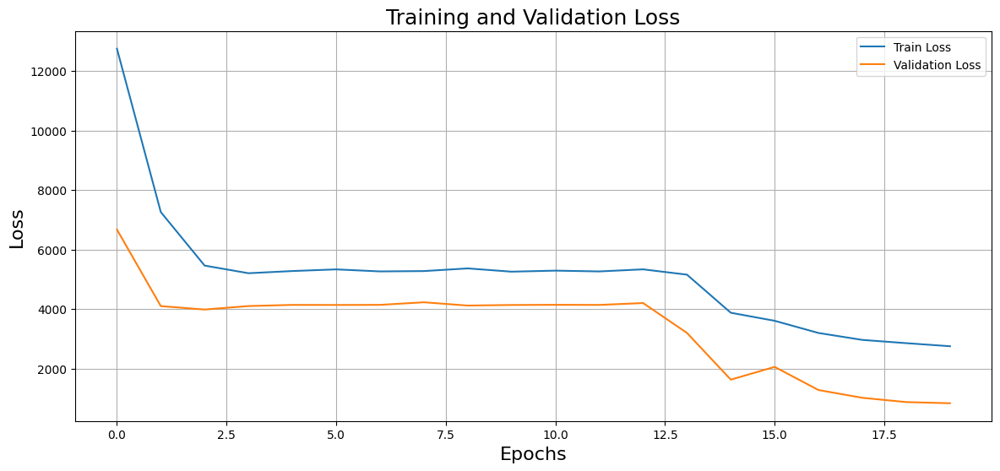

In [143]:
plot_training_history(history)

In [144]:
# Make predictions on train, test and validation data
y_pred_val = lstm_model.predict(val_data_tf)
y_pred_test_extended = lstm_model.predict(test_data_tf_extended)
y_pred_test_shortened = lstm_model.predict(test_data_tf_shortened)

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


In [145]:
# Compute metrics and get predictions for extended test data
df_lstm = compute_metrics_deeplearning(lstm_model, train_data_tf, val_data_tf, test_data_tf_shortened)
df_lstm_cleaned = df_lstm.drop(columns=['Dataset'])
df_lstm_cleaned = df_lstm_cleaned[['RMSE', 'R2', 'MAE']]
df_lstm_cleaned.index = ['Train', 'Validation', 'Test']
df_lstm_cleaned

,RMSE,R2,MAE
Train,46.243536,0.559379,33.044915
Validation,28.898051,0.787305,19.657315
Test,41.866336,-0.015010,32.851147


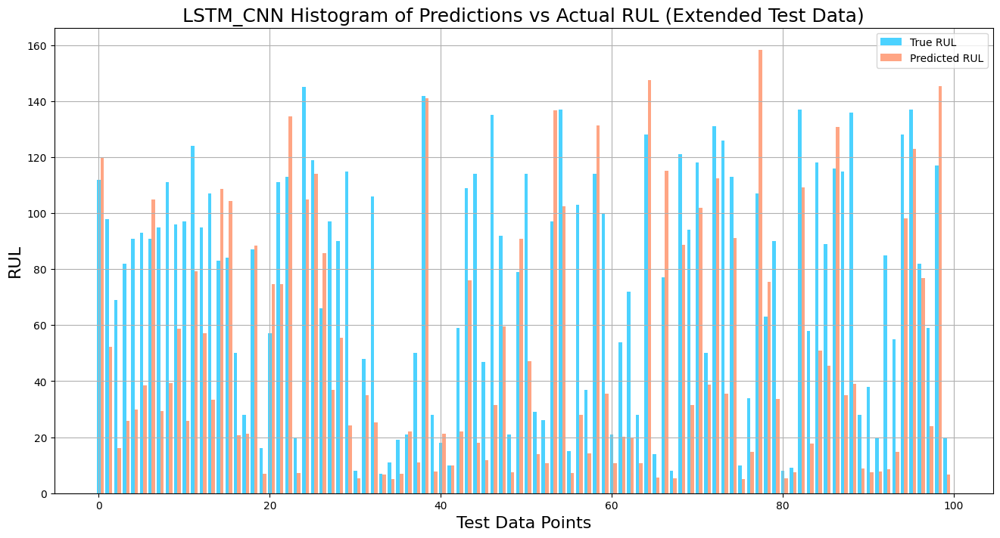

In [146]:
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "LSTM_CNN Histogram of Predictions vs Actual RUL (Extended Test Data)")

## LSTM+CNN Model

In [81]:
# Define model parameters
input_shape = (X_train.shape[1], X_train.shape[2])
lstm_units = 32
cnn_filters = 32
cnn_kernel_size = 3
dense_units = 16

# Build and compile model
lstm_cnn_model = build_lstm_cnn_model(input_shape, lstm_units, cnn_filters, cnn_kernel_size, dense_units)
lstm_cnn_model.compile(optimizer='adam', loss='mse')

# Display model summary
lstm_cnn_model.summary()

# Train the model
history = lstm_cnn_model.fit(train_data_tf, validation_data=val_data_tf, epochs=20, verbose=0)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 20, 16)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 20, 32)              │           6,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 20, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d (Conv1D)                      │ (None, 18, 32)              │           3,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 9, 32)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 288)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,017 (54.75 KB)

 Trainable params: 14,017 (54.75 KB)

 Non-trainable params: 0 (0.00 B)

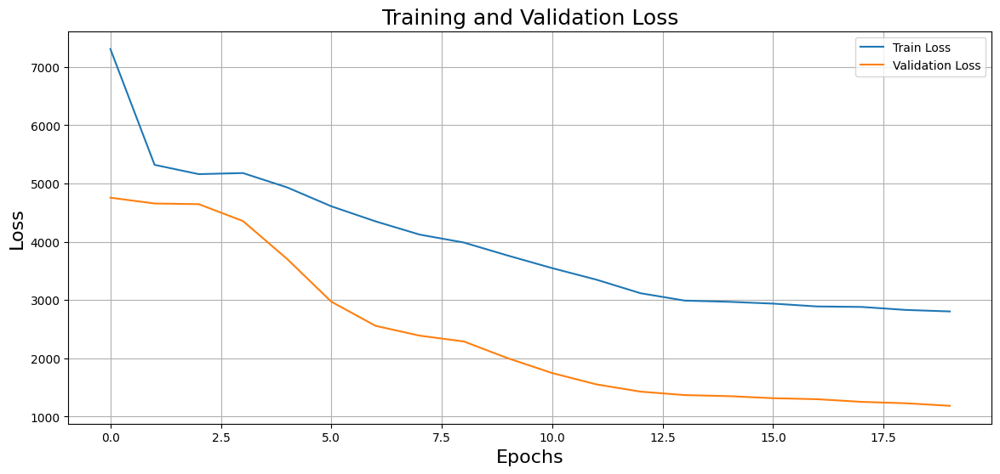

In [82]:
plot_training_history(history)

In [83]:
# Make predictions on train, test and validation data
y_pred_val = lstm_cnn_model.predict(val_data_tf)
y_pred_test_extended = lstm_cnn_model.predict(test_data_tf_extended)
y_pred_test_shortened = lstm_cnn_model.predict(test_data_tf_shortened)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


In [84]:
# Compute metrics and get predictions for extended test data
df_lstm_cnn = compute_metrics_deeplearning(lstm_cnn_model, train_data_tf, val_data_tf, test_data_tf_shortened)
df_lstm_cnn_cleaned = df_lstm_cnn.drop(columns=['Dataset'])
df_lstm_cnn_cleaned = df_lstm_cnn_cleaned[['RMSE', 'R2', 'MAE']]
df_lstm_cnn_cleaned.index = ['Train', 'Validation', 'Test']
df_lstm_cnn_cleaned

,RMSE,R2,MAE
Train,46.674114,0.551135,33.387498
Validation,34.432591,0.698032,23.156833
Test,29.900520,0.482276,22.996172


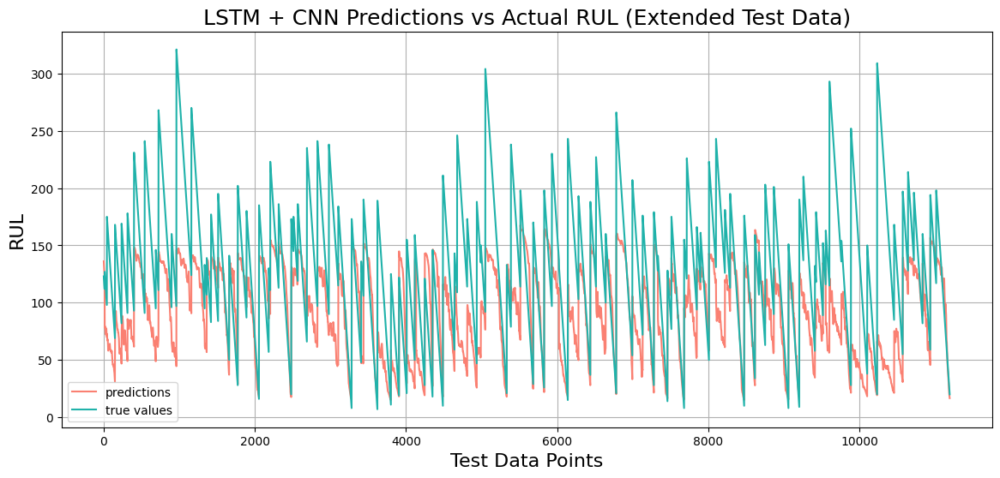

In [85]:
plot_predictions(y_test_extended, y_pred_test_extended, "LSTM + CNN Predictions vs Actual RUL (Extended Test Data)")

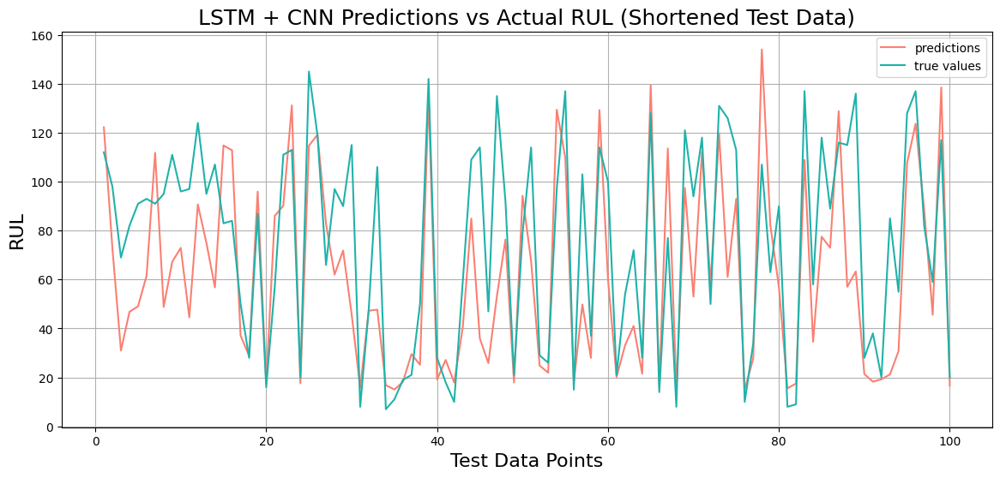

In [86]:
plot_predictions(y_test_shortened, y_pred_test_shortened, "LSTM + CNN Predictions vs Actual RUL (Shortened Test Data)")

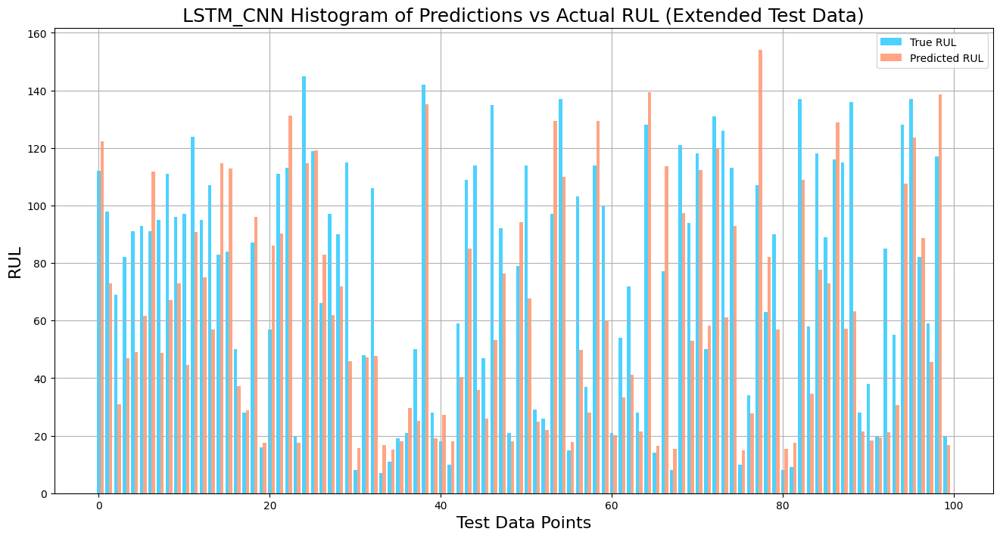

In [87]:
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "LSTM_CNN Histogram of Predictions vs Actual RUL (Extended Test Data)")

### Transformer model

In [88]:
# Define Transformer block
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = tf.keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# Define the complete Transformer model
def build_transformer_model(input_shape, embed_dim, num_heads, ff_dim, rate=0.1):
    inputs = layers.Input(shape=input_shape)
    x = layers.Dense(embed_dim, kernel_regularizer=regularizers.l2(0.01))(inputs)
    transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim, rate)
    x = transformer_block(x, training=True)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dropout(rate)(x)
    x = layers.Dense(20, activation="relu", kernel_regularizer=regularizers.l2(0.01))(x)
    x = layers.Dropout(rate)(x)
    outputs = layers.Dense(1)(x)
    return tf.keras.Model(inputs=inputs, outputs=outputs)

# Define model parameters
input_shape = (X_train.shape[1], X_train.shape[2])
embed_dim = 32
num_heads = 2
ff_dim = 32
dropout_rate = 0.1

# Build and compile model
transformer_model = build_transformer_model(input_shape, embed_dim, num_heads, ff_dim, dropout_rate)
transformer_model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Display model summary
transformer_model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 20, 16)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 20, 32)              │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer_block (TransformerBlock) │ (None, 20, 32)              │          10,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling1d             │ (None, 32)                  │               0 │
│ (GlobalAveragePooling1D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 20)                  │             660 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 20)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              21 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,881 (46.41 KB)

 Trainable params: 11,881 (46.41 KB)

 Non-trainable params: 0 (0.00 B)

In [89]:
# Train the model
# Add EarlyStopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with EarlyStopping
history = transformer_model.fit(train_data_tf, validation_data=val_data_tf, epochs=25, callbacks=[early_stopping])

Epoch 1/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 12038.2842 - val_loss: 5654.1436
Epoch 2/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 5262.3418 - val_loss: 4126.4790
Epoch 3/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3314.9497 - val_loss: 2745.6826
Epoch 4/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2380.2949 - val_loss: 1442.9427
Epoch 5/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2271.2625 - val_loss: 1273.8146
Epoch 6/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2136.8882 - val_loss: 839.3920
Epoch 7/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1980.9498 - val_loss: 854.1198
Epoch 8/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1948.5476 - val_loss: 822.5989
Epoch 9/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1988.2565 - val_loss: 782.6248
Epoch 10/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1928.2899 - val_loss: 831.4125
Epoch 11/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1871.8619 - val_loss

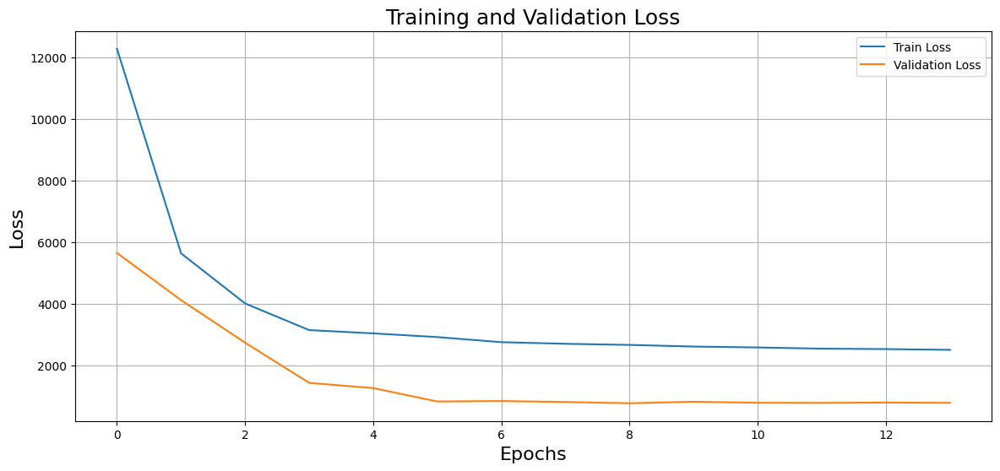

In [90]:
plot_training_history(history)


In [91]:
# Make predictions on train, test and validation data
y_pred_val = transformer_model.predict(val_data_tf)
y_pred_test_extended = transformer_model.predict(test_data_tf_extended)
y_pred_test_shortened = transformer_model.predict(test_data_tf_shortened)

12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step
175/175 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


In [92]:
# Compute metrics and get predictions for extended test data
df_transformer = compute_metrics_deeplearning(transformer_model, train_data_tf, val_data_tf, test_data_tf_shortened)
df_transformer_cleaned = df_transformer.drop(columns=['Dataset'])
df_transformer_cleaned = df_transformer_cleaned[['RMSE', 'R2', 'MAE']]
df_transformer_cleaned.index = ['Train', 'Validation', 'Test']
df_transformer_cleaned

,RMSE,R2,MAE
Train,48.395011,0.517425,36.172361
Validation,27.957090,0.800930,21.250038
Test,45.161104,-0.181053,36.766293


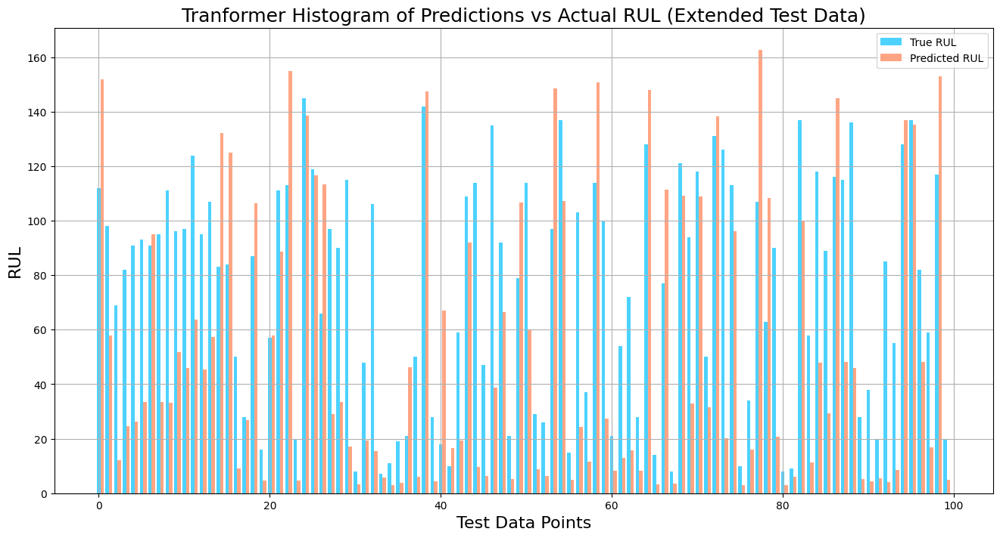

In [93]:
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "Tranformer Histogram of Predictions vs Actual RUL (Extended Test Data)")

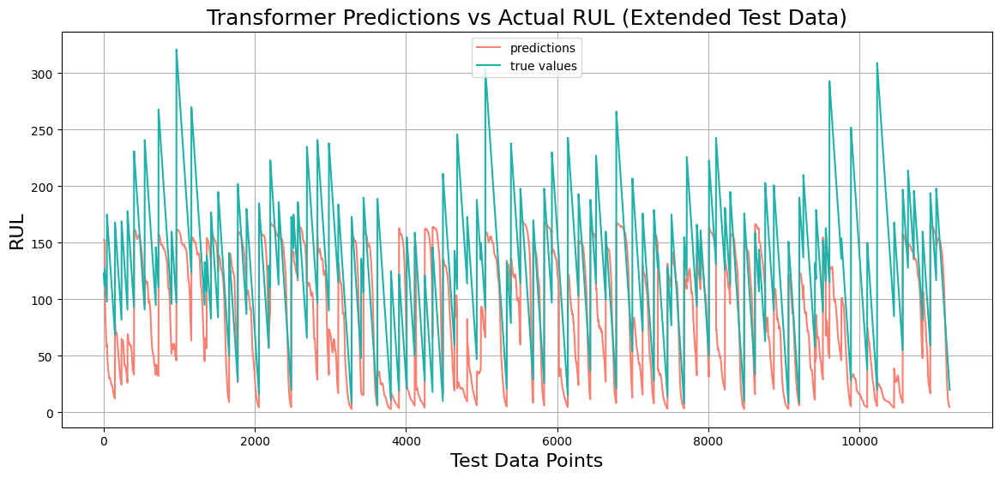

In [94]:
plot_predictions(y_test_extended, y_pred_test_extended, "Transformer Predictions vs Actual RUL (Extended Test Data)")

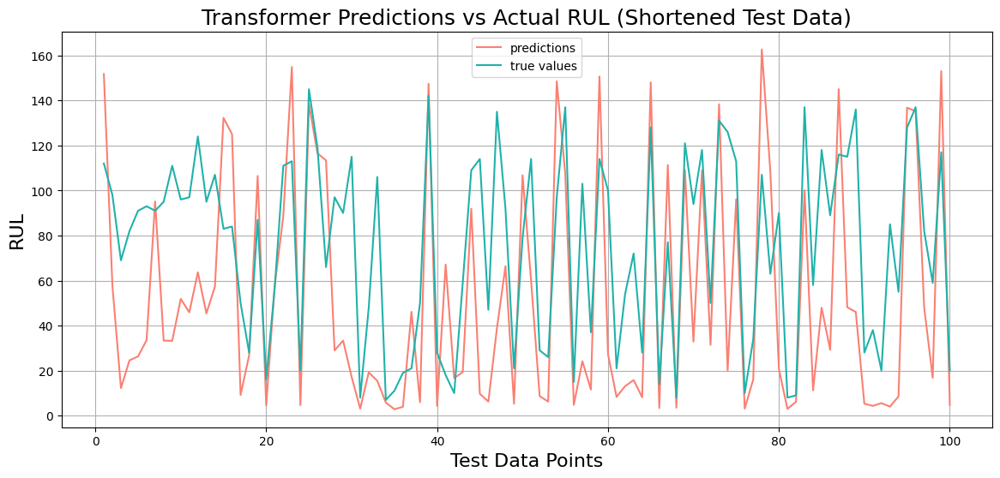

In [95]:
plot_predictions(y_test_shortened,  y_pred_test_shortened, "Transformer Predictions vs Actual RUL (Shortened Test Data)")

# Traditional Models

### Setup data

In [148]:
# Flatten the 3D data for XGBoost
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_val_flat = X_val.reshape(X_val.shape[0], -1)
X_test_extended_flat = X_test_extended.reshape(X_test_extended.shape[0], -1)
X_test_shortened_flat = X_test_shortened.reshape(X_test_shortened.shape[0], -1)

In [149]:
# Train XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=100,
                             learning_rate=0.1)
xgb_model.fit(X_train_flat, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [150]:
def compute_metrics_traditional(model, X_train, y_train, X_val, y_val, X_test, y_test, verbose=False):
    if verbose:
        print("Computing metrics...")

    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)
    y_pred_test = model.predict(X_test)

    metrics = {
        'Train': {
            'RMSE': np.sqrt(mean_squared_error(y_train, y_pred_train)),
            'R2': r2_score(y_train, y_pred_train),
            'MAE': mean_absolute_error(y_train, y_pred_train),
            'SME': np.sum(np.square(y_train - y_pred_train)) / len(y_train)
        },
        'Validation': {
            'RMSE': np.sqrt(mean_squared_error(y_val, y_pred_val)),
            'R2': r2_score(y_val, y_pred_val),
            'MAE': mean_absolute_error(y_val, y_pred_val),
            'SME': np.sum(np.square(y_val - y_pred_val)) / len(y_val)
        },
        'Test': {
            'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_test)),
            'R2': r2_score(y_test, y_pred_test),
            'MAE': mean_absolute_error(y_test, y_pred_test),
            'SME': np.sum(np.square(y_test - y_pred_test)) / len(y_test)
        }
    }

    if verbose:
        print("Metrics computed.")

    return metrics

In [151]:
# Predict on validation and test data
y_pred_val = xgb_model.predict(X_val_flat)
y_pred_test_extended = xgb_model.predict(X_test_extended_flat)
y_pred_test_shortened = xgb_model.predict(X_test_shortened_flat)

In [152]:
# Compute metrics on shortened data
metrics_xgboost = compute_metrics_traditional(xgb_model, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_xgboost = pd.DataFrame(metrics_xgboost).transpose()
metrics_df_xgboost

,RMSE,R2,MAE,SME
Train,9.776904,0.980305,7.053312,95.587855
Validation,22.934272,0.866035,15.740211,525.980829
Test,31.567029,0.422957,24.803324,996.477289


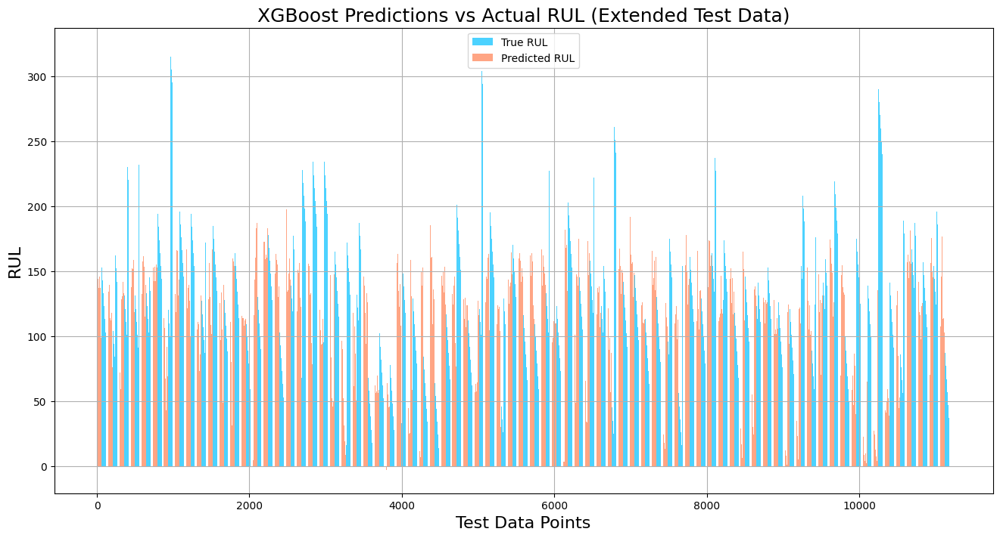

In [153]:
# Call the plot function
plot_prediction_bar(y_test_extended, y_pred_test_extended, "XGBoost Predictions vs Actual RUL (Extended Test Data)")


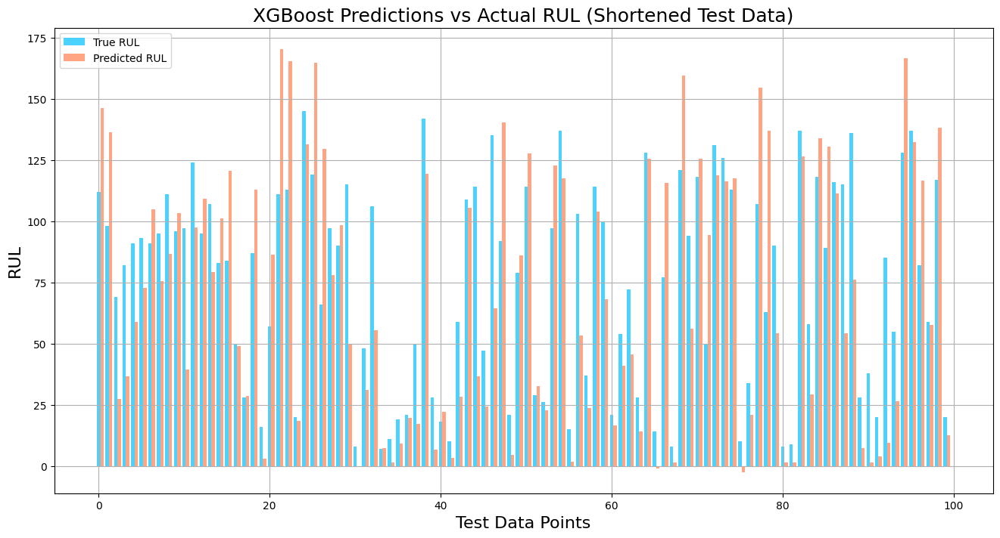

In [154]:
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "XGBoost Predictions vs Actual RUL (Shortened Test Data)")

## Train Random Forest Model

In [104]:
# Initialize the Random Forest model with default parameters
rf = RandomForestRegressor()

# Fit the model
rf.fit(X_train_flat, y_train)

# Predict on validation and test data
y_pred_train = rf.predict(X_train_flat)
y_pred_val = rf.predict(X_val_flat)
y_pred_test_extended = rf.predict(X_test_extended_flat)
y_pred_test_shortened = rf.predict(X_test_shortened_flat)

In [105]:
# Compute metrics on shortened data
metrics_rf = compute_metrics_traditional(rf, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_rf = pd.DataFrame(metrics_rf).transpose()
metrics_df_rf

,RMSE,R2,MAE,SME
Train,6.284534,0.991862,3.823350,39.495374
Validation,26.178897,0.825449,18.443431,685.334645
Test,37.004224,0.207055,29.740800,1369.312626


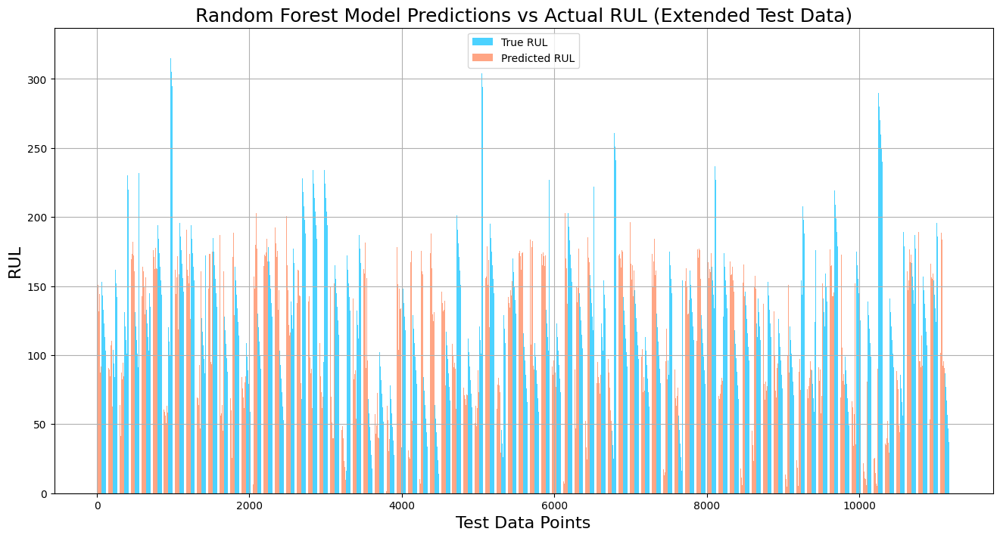

In [106]:
# Call the plot function for Random Forest
plot_prediction_bar(y_test_extended, y_pred_test_extended, "Random Forest Model Predictions vs Actual RUL (Extended Test Data)")


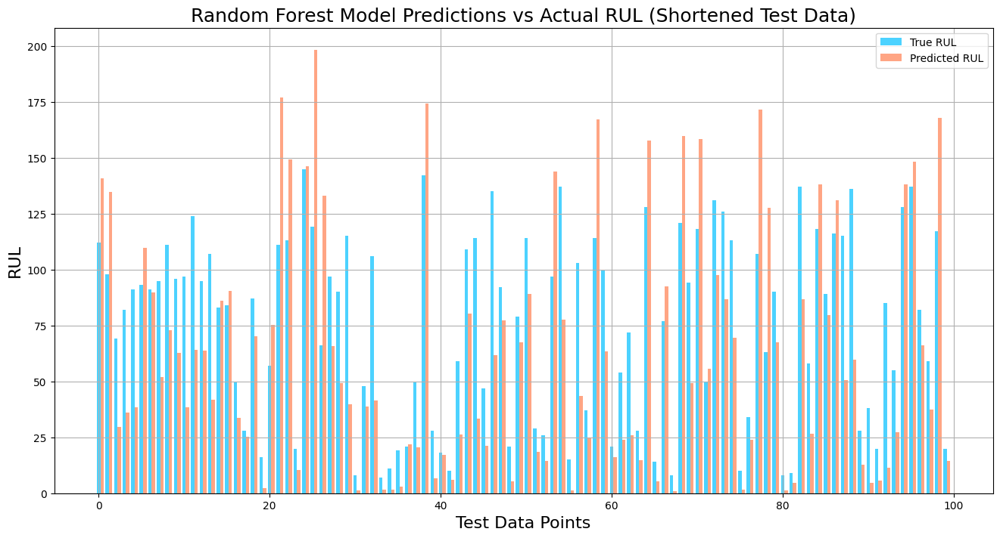

In [107]:
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "Random Forest Model Predictions vs Actual RUL (Shortened Test Data)")

## Decision Tree Model

In [108]:
# Initialize the Decision Tree model with default parameters
dt = DecisionTreeRegressor()

# Fit the model
dt.fit(X_train_flat, y_train)

DecisionTreeRegressor()

In [109]:
# Predict on validation and test data
y_pred_train_dt = dt.predict(X_train_flat)
y_pred_val_dt = dt.predict(X_val_flat)
y_pred_test_extended_dt = dt.predict(X_test_extended_flat)
y_pred_test_shortened_dt = dt.predict(X_test_shortened_flat)

# Compute metrics for the Decision Tree model
metrics_dt = compute_metrics_traditional(dt, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_dt = pd.DataFrame(metrics_dt).transpose()
metrics_df_dt

,RMSE,R2,MAE,SME
Train,0.000000,1.000000,0.000000,0.000000
Validation,44.512732,0.495351,30.883333,1981.383333
Test,46.704925,-0.263182,35.290000,2181.350000


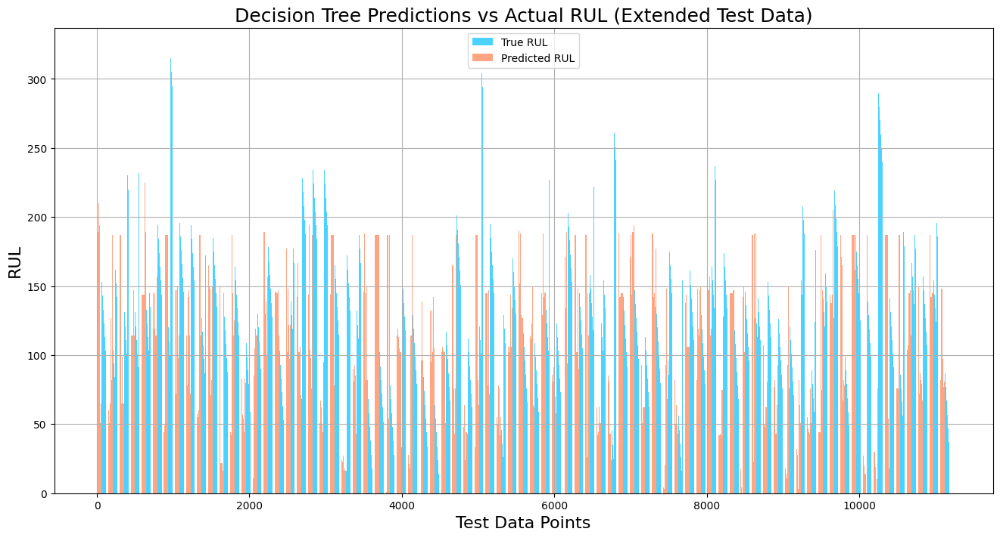

In [110]:
# Plot predictions on extended data
plot_prediction_bar(y_test_extended, y_pred_test_extended_dt, "Decision Tree Predictions vs Actual RUL (Extended Test Data)")

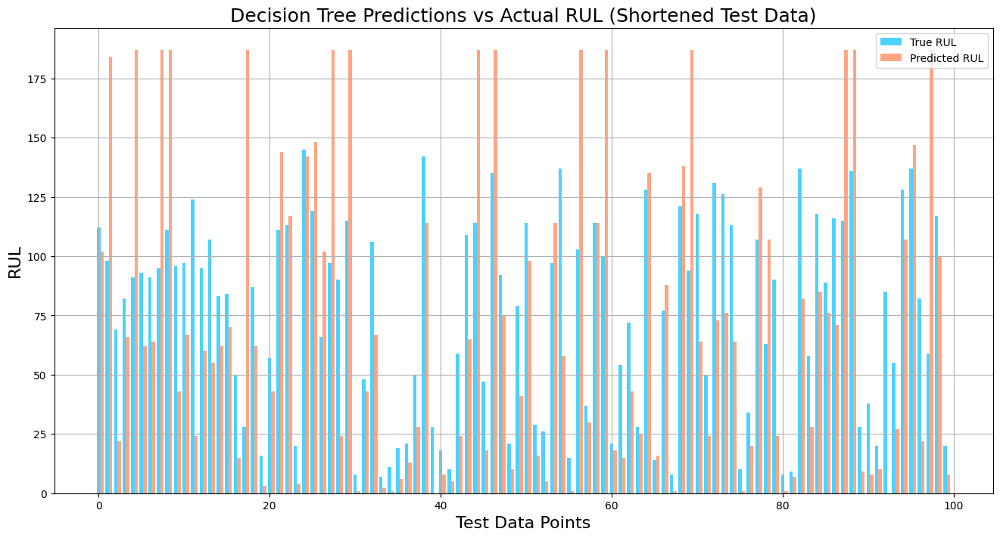

In [111]:
# Plot predictions on shortened data
plot_prediction_bar(y_test_shortened, y_pred_test_shortened_dt, "Decision Tree Predictions vs Actual RUL (Shortened Test Data)")

## Compare Results

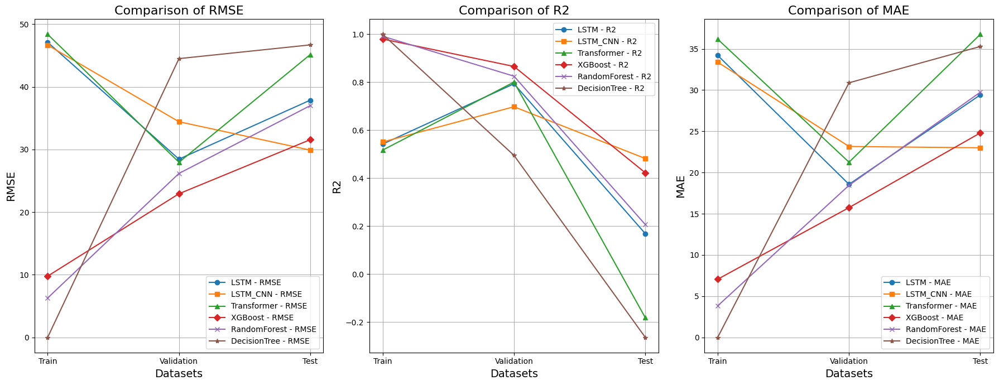

In [112]:
def combine_and_plot_metrics(*dfs, labels):
    combined_df = pd.concat(dfs, axis=1, keys=labels)
    combined_df.columns = [f'{label}_{metric}' for label, metric in combined_df.columns]

    metrics = ['RMSE', 'R2', 'MAE']
    datasets = ['Train', 'Validation', 'Test']
    markers = ['o', 's', '^', 'D', 'x', '*']

    fig, axs = plt.subplots(1, 3, figsize=(18, 7))  # Create a 1 by 3 grid of subplots

    for idx, metric in enumerate(metrics):
        ax = axs[idx]
        for i, label in enumerate(labels):
            ax.plot(datasets, combined_df.loc[datasets, f'{label}_{metric}'], marker=markers[i], label=f'{label} - {metric}')
        ax.set_xlabel('Datasets', fontsize=14)
        ax.set_ylabel(metric, fontsize=14)
        ax.set_title(f'Comparison of {metric}', fontsize=16)
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

labels = ['LSTM', 'LSTM_CNN', 'Transformer', 'XGBoost', 'RandomForest', 'DecisionTree']
combine_and_plot_metrics(df_lstm_cleaned, df_lstm_cnn_cleaned, df_transformer_cleaned, metrics_df_xgboost, metrics_df_rf, metrics_df_dt, labels=labels)

## Hyperparameter Tuning

### Decision Tree Model

In [113]:
# Initialize the Decision Tree model
dt = DecisionTreeRegressor()

# Define the parameter grid
param_grid = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 10, 20, 30],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_features': [None, 'sqrt', 'log2', 0.5]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_flat, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", -grid_search.best_score_)

# Get the best model
best_dt = grid_search.best_estimator_

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best Parameters: {'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 8, 'min_samples_split': 30}
Best Score: 2437.2458041860073


                 RMSE        R2        MAE          SME
Train       29.769507  0.817398  19.493853   886.223524
Validation  32.705340  0.727568  22.319358  1069.639250
Test        47.307615 -0.295993  35.634250  2238.010402


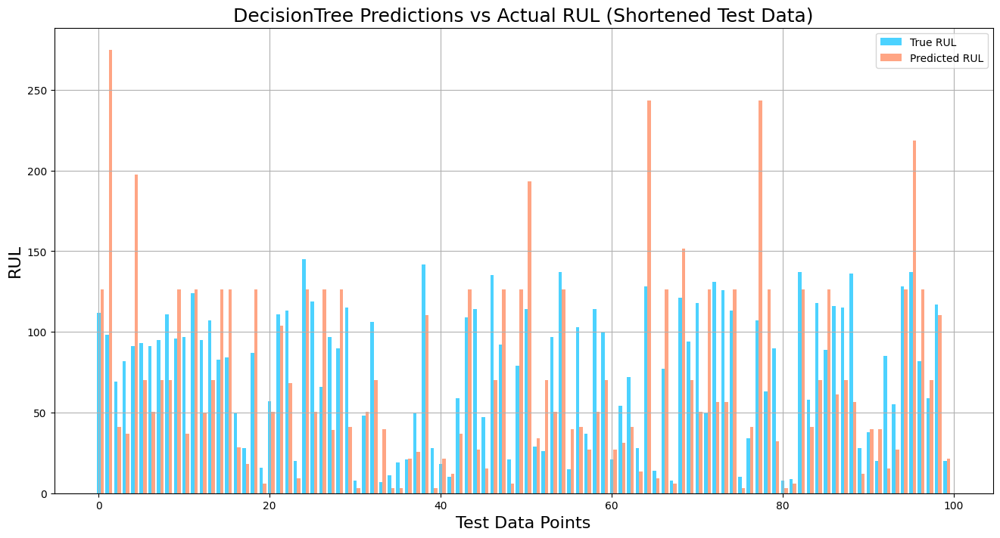

In [114]:
# Fit the best model on the training data
best_dt.fit(X_train_flat, y_train)

# Make predictions on validation and test data
y_pred_val = best_dt.predict(X_val_flat)
y_pred_test_extended = best_dt.predict(X_test_extended_flat)
y_pred_test_shortened = best_dt.predict(X_test_shortened_flat)

# Evaluate the model
metrics_dt = compute_metrics_traditional(best_dt, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_dt = pd.DataFrame(metrics_dt).transpose()
metrics_df_dt.index = ['Train', 'Validation', 'Test']
print(metrics_df_dt)

# Plot predictions for validation and test data
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "DecisionTree Predictions vs Actual RUL (Shortened Test Data)")


### Random Forest Model

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best Parameters: {'min_samples_leaf': 2, 'n_estimators': 100}
Best Score: 1857.116051489646
                 RMSE        R2        MAE          SME
Train        6.713843  0.990712   4.060732    45.075693
Validation  26.169040  0.825580  18.231839   684.818652
Test        37.616572  0.180594  30.157783  1415.006465


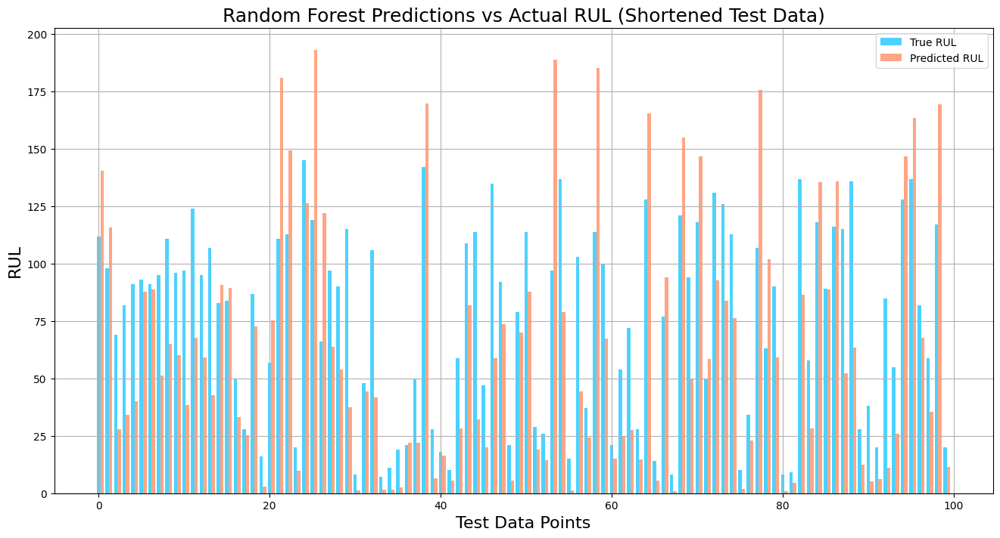

In [115]:
# Initialize the Random Forest model
rf_model = RandomForestRegressor()

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100],
    'min_samples_leaf': [1, 2, 4],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_flat, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", -grid_search.best_score_)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Fit the best model on the training data
best_rf_model.fit(X_train_flat, y_train)

# Make predictions on validation and test data
y_pred_val = best_rf_model.predict(X_val_flat)
y_pred_test_extended = best_rf_model.predict(X_test_extended_flat)
y_pred_test_shortened = best_rf_model.predict(X_test_shortened_flat)

# Evaluate the model
metrics_rf = compute_metrics_traditional(best_rf_model, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_rf = pd.DataFrame(metrics_rf).transpose()
metrics_df_rf.index = ['Train', 'Validation', 'Test']
print(metrics_df_rf)

# Plot predictions for validation and test data
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "Random Forest Predictions vs Actual RUL (Shortened Test Data)")


### XGBoost Model

In [ ]:
# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')

# Define the parameter grid focusing on the most impactful parameters
param_grid = {
    'n_estimators': [100, 200, 300, 400],  # Number of trees
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate
    'max_depth': [3, 5, 7, 9],  # Depth of trees
    'subsample': [0.7, 0.8, 0.9, 1.0],  # Subsampling ratio of the training instances
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]  # Subsampling ratio of features
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the model
grid_search.fit(X_train_flat, y_train)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", -grid_search.best_score_)

# Get the best model
best_xgb_model = grid_search.best_estimator_

# Fit the best model on the training data
best_xgb_model.fit(X_train_flat, y_train)

# Make predictions on validation and test data
y_pred_val = best_xgb_model.predict(X_val_flat)
y_pred_test_extended = best_xgb_model.predict(X_test_extended_flat)
y_pred_test_shortened = best_xgb_model.predict(X_test_shortened_flat)

# Evaluate the model
metrics_xgb = compute_metrics_traditional(best_xgb_model, X_train_flat, y_train, X_val_flat, y_val, X_test_shortened_flat, y_test_shortened)
metrics_df_xgb = pd.DataFrame(metrics_xgb).transpose()
metrics_df_xgb.index = ['Train', 'Validation', 'Test']
print(metrics_df_xgb)

# Plot predictions on shortened test data
plot_prediction_bar(y_test_shortened, y_pred_test_shortened, "XGBoost Predictions vs Actual RUL (Shortened Test Data)")

Fitting 5 folds for each of 1024 candidates, totalling 5120 fits


In [116]:
X_train_flat.shape

(11415, 320)

In [117]:
y_train.shape

(11415,)

In [118]:
y_train

array([162., 161., 160., ...,   2.,   1.,   0.])

## Anomaly Detection (for prescriptive maintenance modeling)

### Identify model bins or risk regions

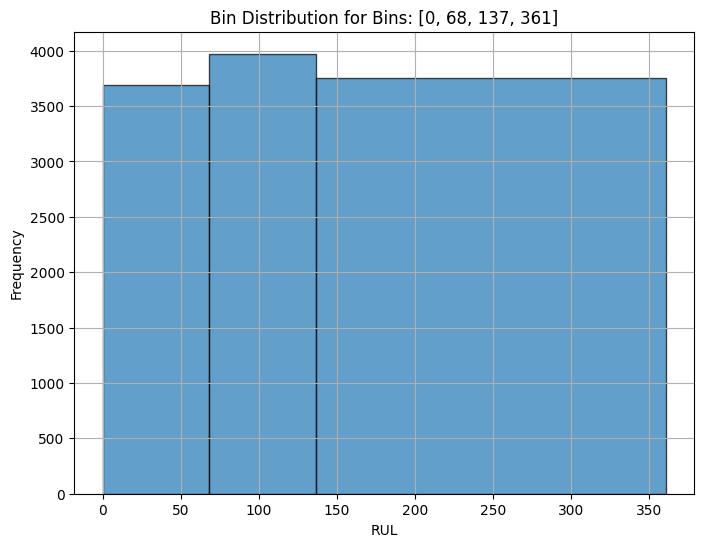

Bins: [0, 68, 137, 361]
Bin counts: [3687. 3972. 3756.]



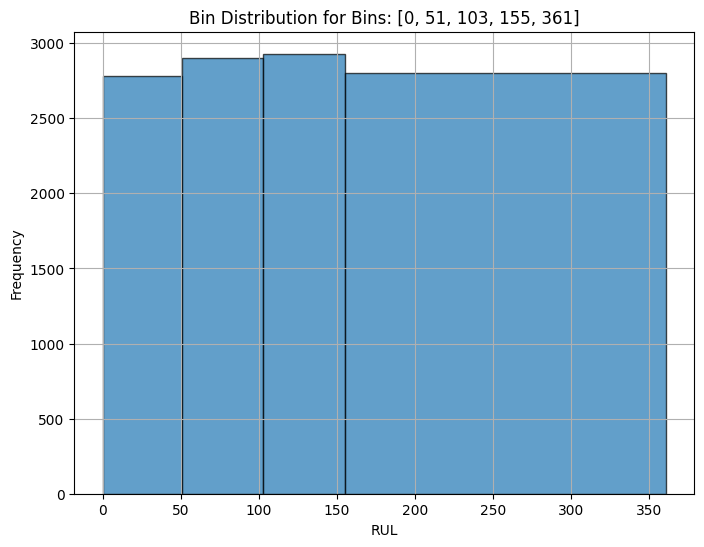

Bins: [0, 51, 103, 155, 361]
Bin counts: [2783. 2902. 2930. 2800.]



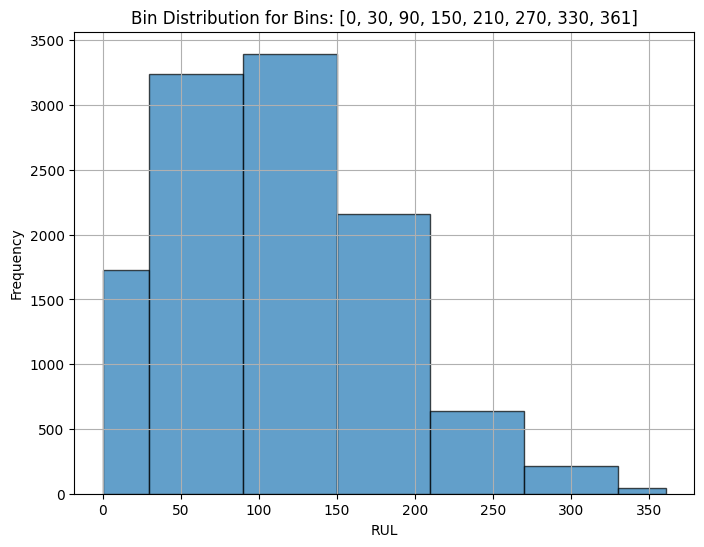

Bins: [0, 30, 90, 150, 210, 270, 330, 361]
Bin counts: [1724. 3239. 3397. 2162.  638.  212.   43.]



In [119]:
def plot_bin_distributions(y_train, bins_list):
    """
    Plots the bin distributions for different bin combinations.

    Parameters:
    y_train (np.array): Array containing the RUL values.
    bins_list (list): List of bin edges to use for binning the RUL values.
    """
    for bins in bins_list:
        plt.figure(figsize=(8, 6))
        bin_counts, bin_edges, _ = plt.hist(y_train, bins=bins, edgecolor='black', alpha=0.7)
        plt.title(f'Bin Distribution for Bins: {bins}')
        plt.xlabel('RUL')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

        print(f'Bins: {bins}')
        print(f'Bin counts: {bin_counts}')
        print()

# Call the function
bins_list = [
    [0, 68, 137, 361],
    [0, 51, 103, 155, 361],
    [0, 30, 90, 150, 210, 270, 330, 361]
]

plot_bin_distributions(y_train, bins_list)


### Train Anomaly detection model based on different risk regions

In [121]:
# Define bins and labels
bins = [0, 68, 137, 361]
labels = [1, 2, 3]  # 1: high_risk, 2: moderate_risk, 3: no_risk

# Bin the RUL data
y_train_binned = pd.cut(y_train, bins=bins, labels=labels, include_lowest=True)

# Create a class dictionary
class_dict = {1: "high_risk", 2: "moderate_risk", 3: "low_risk"}
print("Class Dictionary:", class_dict)

# Split the data into training and testing sets
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_train_flat, y_train_binned, test_size=0.2, random_state=42)


Class Dictionary: {1: 'high_risk', 2: 'moderate_risk', 3: 'low_risk'}


In [122]:
print(X_train_class.shape)
print(X_test_class.shape)
print(y_train_class.shape)
print(y_test_class.shape)

(9132, 320)
(2283, 320)
(9132,)
(2283,)


In [123]:
y_test_class

[1, 1, 1, 3, 3, ..., 3, 2, 2, 1, 2]
Length: 2283
Categories (3, int64): [1 < 2 < 3]

In [124]:
# Adjust the labels to start from 0
y_train_class = y_train_class.astype(int) - 1
y_test_class = y_test_class.astype(int) - 1

y_test_class

array([0, 0, 0, ..., 1, 0, 1])

In [125]:
# Define a function to train and evaluate a model with a confusion matrix heatmap
def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred, target_names=list(class_dict.values()))
    conf_matrix = confusion_matrix(y_test, y_pred)

    print(f"Model: {model_name}")
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:")
    print(class_report)

    # Plot confusion matrix heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=True,
                xticklabels=list(class_dict.values()), yticklabels=list(class_dict.values()),
                linewidths=.5, linecolor='black', square=True)
    plt.title(f'Confusion Matrix for {model_name}', fontsize=16)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)

    return model

Model: XGBoost
Accuracy: 0.9781
Classification Report:
               precision    recall  f1-score   support

    high_risk       0.98      0.98      0.98       759
moderate_risk       0.97      0.96      0.97       793
     low_risk       0.98      0.99      0.98       731

     accuracy                           0.98      2283
    macro avg       0.98      0.98      0.98      2283
 weighted avg       0.98      0.98      0.98      2283



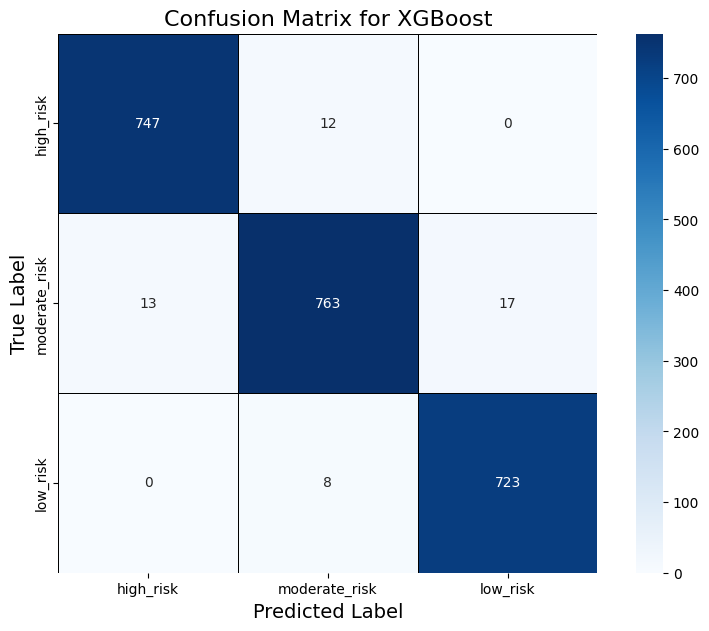

In [126]:
# Train and evaluate XGBoost Classifier
xgb_model = XGBClassifier(objective='multi:softprob', num_class=3, eval_metric='mlogloss')
trained_xgb_model = train_and_evaluate_model(xgb_model, X_train_class, y_train_class, X_test_class, y_test_class, "XGBoost")

Model: Random Forest
Accuracy: 0.9864
Classification Report:
               precision    recall  f1-score   support

    high_risk       0.99      0.99      0.99       759
moderate_risk       0.98      0.98      0.98       793
     low_risk       0.99      0.99      0.99       731

     accuracy                           0.99      2283
    macro avg       0.99      0.99      0.99      2283
 weighted avg       0.99      0.99      0.99      2283



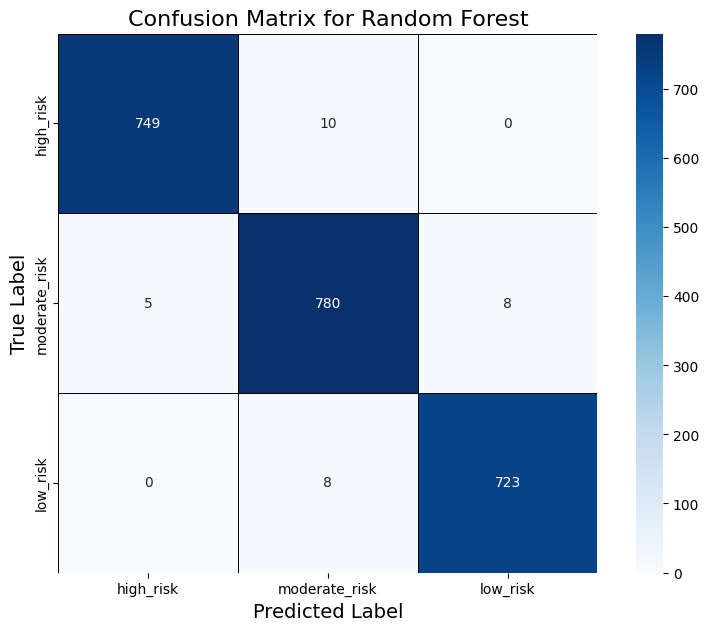

In [127]:
# Train and evaluate Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
trained_rf_model = train_and_evaluate_model(rf_model, X_train_class, y_train_class, X_test_class, y_test_class, "Random Forest")

Model: Decision Tree
Accuracy: 0.8590
Classification Report:
               precision    recall  f1-score   support

    high_risk       0.90      0.93      0.92       759
moderate_risk       0.82      0.80      0.81       793
     low_risk       0.85      0.85      0.85       731

     accuracy                           0.86      2283
    macro avg       0.86      0.86      0.86      2283
 weighted avg       0.86      0.86      0.86      2283



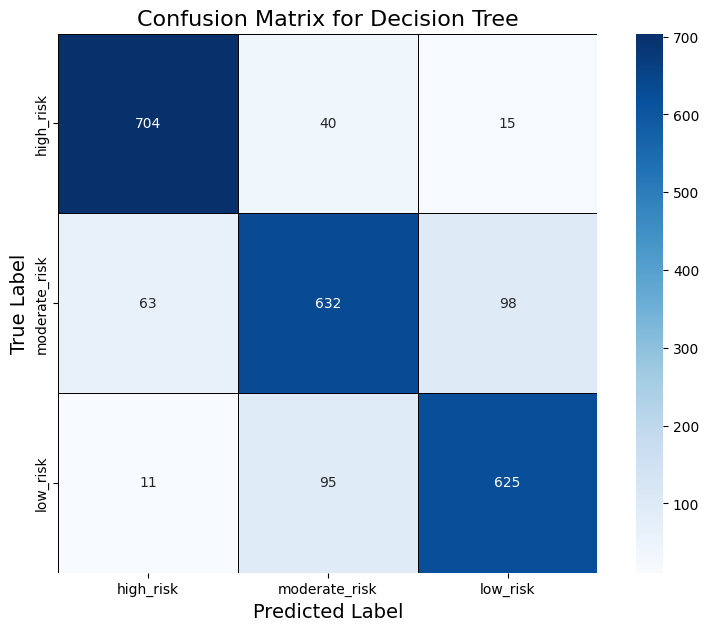

In [128]:
# Train and evaluate Decision Tree Classifier
dt_model = DecisionTreeClassifier(random_state=42)
trained_dt_model = train_and_evaluate_model(dt_model, X_train_class, y_train_class, X_test_class, y_test_class, "Decision Tree")